In [ ]:
import numpy as np
import scipy.linalg as la
from scipy.integrate import trapezoid
import matplotlib.pyplot as plt
import os

# Configuración de estilo
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12

# Constantes del sistema para que E_n = n^2 en pozo infinito de ancho pi
# E_n = (hbar^2 * pi^2 * n^2) / (2 * m * L^2)
# Con L=pi, se reduce a: E_n = (hbar^2 * n^2) / (2m)
# Queremos E_n = n^2, entonces hbar^2 / (2m) = 1 => si hbar=1, m=0.5
HBAR = 1.0
MASS = 0.5
L_WELL = np.pi
KB = 1.0  # Para que t sea directamente kT

# Definició de funciones analíticas para referencias
def phi_infinite(n, x):
    # Solo válido en [0, pi]
    val = np.zeros_like(x)
    mask = (x >= 0) & (x <= np.pi)
    val[mask] = np.sqrt(2/np.pi) * np.sin(n * x[mask])
    return val

def E_infinite(n):
    return n**2

## Marco Teórico: Pozo Finito y Termalización

### 1. Pozo Cuadrado Finito (1D)
- Potencial: $V(x)=0$ para $0\le x\le L$ y $V(x)=V_0$ fuera. Con $V_0<\infty$ la función de onda penetra en las barreras y aparecen estados ligados ($E_n<V_0$) más un continuo discretizado por el dominio numérico.
- Base analítica de referencia (pozo infinito): $\phi_n(x)=\sqrt{2/L}\,\sin(n\pi x/L)$ y $E_n = n^2 E_1$ con $E_1 = \pi^2\hbar^2/(2mL^2)$.

### 2. Método de Numerov Matricial
- Ecuación de Schrödinger estacionaria: $-\frac{\hbar^2}{2m}\psi''(x)+V(x)\psi=E\psi$.
- Numerov usa un esquema de orden $O(dx^4)$ y lleva a un problema generalizado $A\psi = \epsilon B\psi$ con $\epsilon = 2mE/\hbar^2$. Resolvemos con `eig` y normalizamos numéricamente.
- Dominio extendido: usamos $x\in[x_{\min},x_{\max}]$ para capturar la cola evanescente y discretizar parte del continuo.

### 3. Termalización en Ensamble Canónico
- Probabilidad térmica (una partícula): $P_{\rm th}(x,t)=\frac{1}{Z}\sum_n e^{-(E_n-E_0)/t}\,|\psi_n(x)|^2$ con $t=k_BT/E_1^{\rm inf}$.
- Para dos partículas idénticas: $\hat P_{n_1,n_2}(x_1,x_2)$ se simmetriza/antisimmetriza (bosones/fermiones) y se promedian con Boltzmann: $P_{\rm th}^{(2)}=Z^{-1}\sum_{n_1,n_2} e^{-(E_{n_1}+E_{n_2}-2E_0)/t}\,\hat P_{n_1,n_2}$.
- Espín: se combinan partes espacial y de espín. Fermiones $s=1/2$: $\tfrac14 P_{\rm S}+\tfrac34 P_{\rm A}$. Bosones $s=1$: $\tfrac23 P_{\rm S}+\tfrac13 P_{\rm A}$.

### 4. Convergencia de la Suma Térmica
- Objetivo: hallar el número mínimo de términos $N(t)$ tal que $P_{\rm th}$ cambia menos que $10^{-4}$ al agregar estados adicionales.
- En pozo finito, parte del continuo puede contribuir si $t$ es grande; verificamos si el corte $E_{N(t)}$ supera $V_0$ para advertir uso de estados no ligados.

### 5. Comparativas
- **Figura 1(a)**: 4 subplots (Low/Medium/High/V0=∞) mostrando efecto de $t$ en $P_{\rm th}(x)$.
- **Figura 1(b)**: mismo set, pero para ancho de capa/tunelamiento, permitiendo $x<0$ (salida de la caja).
- Resto de figuras: comparativas dos casos (Low vs ∞) con 3D + heatmaps y térmicos con espín.

In [ ]:
def solve_schrodinger_numerov(x_grid, V_array, m=MASS, hbar=HBAR):
    """
    Resuelve la Ec. de Schrödinger 1D usando Numerov Matricial.
    Retorna energías y autofunciones normalizadas.
    """
    N = len(x_grid)
    dx = x_grid[1] - x_grid[0]

    # Factor de escalamiento: f = 2m/hbar^2
    # La ecuación es: psi'' + f(E - V)psi = 0
    # Numerov: (1 + dx^2/12 * k_{i+1})psi_{i+1} - 2(1 - 5dx^2/12 * k_i)psi_i + (1 + dx^2/12 * k_{i-1})psi_{i-1} = 0
    # Donde k(x) = f(E - V(x)).
    # Esto lleva a la forma matricial generalizada A * psi = E * B * psi descrita en schrodinger_numerov.ipynb

    # Construcción de matrices (versión optimizada para legibilidad)
    # A = (-1/dx^2) * M_{-2} + (1/12) * M_{10} * U
    # B = (1/12) * M_{10} * (2m/hbar^2)
    # Sin embargo, schrodinger_numerov implementaba:
    # A_mat = Kinetic + Potential_Term
    # B_mat = (1/12) * M_10
    # E_eigen = 2mE/hbar^2

    factor = 2 * m / hbar**2
    U = factor * V_array

    # Matrices diagonales base (tamaño N-2 para condiciones de frontera 0 en extremos)
    n_internal = N - 2

    # M_-2: diag principal -2, off-diag 1
    M_m2 = np.zeros((n_internal, n_internal))
    np.fill_diagonal(M_m2, -2)
    np.fill_diagonal(M_m2[1:], 1)
    np.fill_diagonal(M_m2[:, 1:], 1)

    # M_10: diag principal 10, off-diag 1
    M_10 = np.zeros((n_internal, n_internal))
    np.fill_diagonal(M_10, 10)
    np.fill_diagonal(M_10[1:], 1)
    np.fill_diagonal(M_10[:, 1:], 1)

    # Término Cinético: (-1/dx^2) * M_m2
    T_mat = (-1.0 / dx**2) * M_m2

    # Término Potencial: (1/12) * M_10 @ diag(U_internal)
    U_internal = U[1:-1]
    V_mat = (1.0 / 12.0) * (M_10 @ np.diag(U_internal))

    # Matrices del problema generalizado
    A = T_mat + V_mat
    B = (1.0 / 12.0) * M_10

    # Resolver A psi = epsilon B psi
    evals, evecs = la.eig(A, B)

    # Recuperar energías reales E = epsilon * hbar^2 / 2m
    energies = np.real(evals) * (hbar**2 / (2 * m))

    # Ordenar
    idx = np.argsort(energies)
    energies = energies[idx]
    psi_internal = np.real(evecs[:, idx])

    # Reconstruir psi completa (con ceros en bordes)
    psi_full = np.zeros((N, len(energies)))
    psi_full[1:-1, :] = psi_internal

    # Normalizar usando trapecio
    for i in range(len(energies)):
        norm = trapezoid(psi_full[:, i]**2, x_grid)
        psi_full[:, i] /= np.sqrt(norm)

    return energies, psi_full

def get_potential(x, V0, well_width=np.pi):
    """
    Crea el potencial de pozo finito centrado en la región [0, pi].
    V(x) = 0 si 0 <= x <= pi
    V(x) = V0 en otro caso
    """
    V = np.full_like(x, V0)
    mask = (x >= 0) & (x <= well_width)
    V[mask] = 0.0
    return V

# Configuración del dominio de simulación
# Necesitamos márgenes para ver el decaimiento y continuum
# Pozo entere [0, pi] (~0 a 3.14)
# Grid desde -1.5 a 4.5 para tener márgenes
X_MIN = -np.pi / 2
X_MAX = 3 * np.pi / 2
N_POINTS = 600
X_GRID = np.linspace(X_MIN, X_MAX, N_POINTS)

# Definición de casos de V0
# E1_inf = 1.0 (en nuestras unidades)
# Case Low: V0 = 10 (aprox n=3 para infinito)
# Case Med: V0 = 50 (aprox n=7 para infinito)
# Case High: V0 = 1000 (pseudo infinito)
CASES = {
    'Low': {'V0': 10.0, 'label': 'Finito Bajo ($V_0=10$)', 'color': '#1f77b4'},
    'Medium': {'V0': 50.0, 'label': 'Finito Medio ($V_0=50$)', 'color': '#ff7f0e'},
    'High': {'V0': 1000.0, 'label': 'Pseudo Infinito ($V_0=1000$)', 'color': '#2ca02c'}
}

# Pre-cálculo de soluciones
SOLUTIONS = {}
print("Calculando soluciones numéricas...")
for key, params in CASES.items():
    V = get_potential(X_GRID, params['V0'])
    Es, Psis = solve_schrodinger_numerov(X_GRID, V)
    SOLUTIONS[key] = {'E': Es, 'Psi': Psis, 'V': V, 'x': X_GRID}
    print(f"Caso {key}: Calculados {len(Es)} estados. E_fund = {Es[0]:.4f}")

Calculando soluciones numéricas...
Caso Low: Calculados 598 estados. E_fund = 0.6883
Caso Medium: Calculados 598 estados. E_fund = 0.8386
Caso High: Calculados 598 estados. E_fund = 0.9574


In [ ]:
def calc_thermal_density(x, energies, wavefunctions, t, nmax=None, convergence_tol=1e-4):
    """
    Calcula P_th(x, t) sumando estados hasta convergencia o nmax.
    Maneja el criterio de convergencia para pozo finito.
    """
    if nmax is None:
        nmax = len(energies)

    # Inicialización
    rho_accum = np.zeros_like(x)
    Z = 0.0

    # Usar E[0] como referencia para evitar overflow
    E0 = energies[0]

    # Análisis de convergencia (si se pide debug o plotear N(t))
    # Aquí sumamos todo vectorizado para eficiencia
    # Pero para chequear convergencia "step by step" necesitaríamos bucle

    n_terms = min(nmax, len(energies))

    # Pesos de Boltzmann
    weights = np.exp(-(energies[:n_terms] - E0) / t)

    # Densidades |psi|^2
    densities = wavefunctions[:, :n_terms]**2

    # Suma pesada
    # rho(x) = sum(w_i * |psi_i|^2)
    rho_sum = densities @ weights
    Z = np.sum(weights)

    return rho_sum / Z

def check_convergence_finite_well(energies, t, tol=1e-4):
    """
    Determina cuantos estados son necesarios para convergencia.
    Verifica si los estados del continuo (E > V0) son problemáticos.
    """
    E0 = energies[0]
    weights = np.exp(-(energies - E0) / t)
    Z_partial = np.cumsum(weights)

    # Criterio: variación relativa de Z es menor a tol
    # |Z_n - Z_{n-1}| / Z_n < tol

    diff = np.abs(np.diff(Z_partial))
    # Indices donde el cambio es menor que tol * Z_final_estimado
    # O simplemente cuando el peso es muy pequeño

    # Buscamos donde el peso relativo cae por debajo de tol
    relative_weight = weights / Z_partial[-1]

    # Encontrar el n donde relative_weight < tol y se mantiene
    # Simplemente retornamos el N donde weight < tol * Z_total

    mask = weights < (tol * Z_partial[-1])
    # Encontrar el primer True que sea seguido solo por Trues (cola)
    # Forma simple: argmax de weights (decreciente) < umbral
    if not np.any(mask):
        return len(energies)

    # Dado que E es creciente, weights es decreciente
    idx = np.argmax(mask)
    return idx + 1

# Verificación rápida de convergencia
t_test = 10.0
print(f"Análisis de convergencia para T={t_test}:")
for key, sol in SOLUTIONS.items():
    N_conv = check_convergence_finite_well(sol['E'], t_test)
    E_cutoff = sol['E'][N_conv-1]
    V0 = CASES[key]['V0']
    print(f"  {key} (V0={V0}): Convierte con {N_conv} estados (E_cut={E_cutoff:.2f}).")
    if E_cutoff > V0:
        print(f"    -> Incluye estados del continuo (E > {V0})!")
    else:
        print(f"    -> Convergencia dentro de estados ligados.")

Análisis de convergencia para T=10.0:
  Low (V0=10.0): Convierte con 18 estados (E_cut=85.93).
    -> Incluye estados del continuo (E > 10.0)!
  Medium (V0=50.0): Convierte con 15 estados (E_cut=84.51).
    -> Incluye estados del continuo (E > 50.0)!
  High (V0=1000.0): Convierte con 10 estados (E_cut=95.68).
    -> Convergencia dentro de estados ligados.


## Análisis de Convergencia: Comparativa de Cuatro Potenciales

Evaluamos cuántos términos de la suma térmica son necesarios para alcanzar convergencia en cada temperatura y para cada potencial:

- **Criterio**: $\max_x |P_{\rm th}^{(N)}(x) - P_{\rm th}^{(N-1)}(x)| < 10^{-4}$

Este análisis revela diferencias fundamentales: el pozo infinito requiere más estados a alta temperatura debido al espaciamiento uniforme $E_n = n^2$, mientras que pozos finitos con $V_0$ bajo tienen menos estados ligados disponibles y convergen más rápido (pero pueden necesitar estados del continuo si $t \gg V_0$).

Calculando N convergido para cada temperatura y potencial...

Temperatura t = 1
  Infinito: N = 4
  High: N = 4
  Medium: N = 4
  Low: N = 4

Temperatura t = 5
  Infinito: N = 7
  High: N = 7
  Medium: N = 7
  Low: N = 12

Temperatura t = 10
  Infinito: N = 9
  High: N = 9
  Medium: N = 14
  Low: N = 16

Temperatura t = 20
  Infinito: N = 13
  High: N = 13
  Medium: N = 21
  Low: N = 22

Temperatura t = 30
  Infinito: N = 15
  High: N = 15
  Medium: N = 26
  Low: N = 27

Temperatura t = 50
  Infinito: N = 19
  High: N = 19
  Medium: N = 33
  Low: N = 33

Temperatura t = 80
  Infinito: N = 23
  High: N = 24
  Medium: N = 41
  Low: N = 41

Temperatura t = 100
  Infinito: N = 26
  High: N = 26
  Medium: N = 45
  Low: N = 45

Temperatura t = 150
  Infinito: N = 31
  High: N = 32
  Medium: N = 54
  Low: N = 54

Temperatura t = 200
  Infinito: N = 35
  High: N = 47
  Medium: N = 62
  Low: N = 61

✓ Convergencia calculada para todos los casos


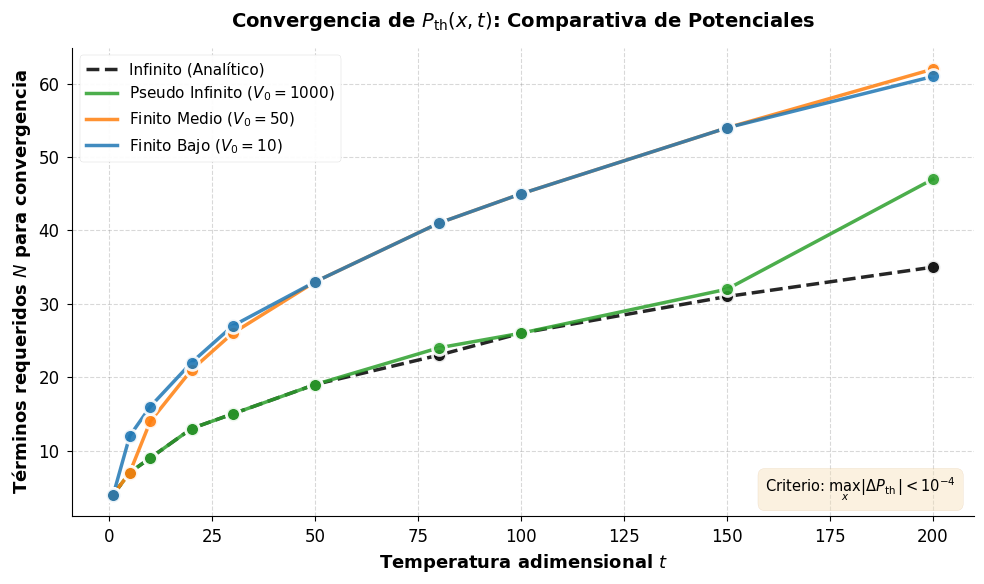


✓ Análisis de convergencia completado


In [ ]:
# Análisis de Convergencia: N(t) para cada potencial

# Función de convergencia para analizar N(t) en cada potencial

def find_N_converged(x, energies, wavefunctions, t, tol=1e-4, max_attempts=None):
    """
    Encuentra el número de términos N necesarios para que la suma térmica converja.
    Criterio: max_x |P_N - P_{N-1}| < tol
    """
    if max_attempts is None:
        max_attempts = len(energies)

    E0 = energies[0]

    # Calcular suma acumulativa para detectar convergencia
    P_prev = np.zeros_like(x)
    Z_prev = 0.0

    for n in range(1, min(max_attempts + 1, len(energies))):
        # Calcular P_th con n términos
        weights = np.exp(-(energies[:n] - E0) / t)
        densities = wavefunctions[:, :n]**2

        P_current = (densities @ weights) / np.sum(weights)

        # Verificar convergencia
        if n > 1:
            diff = np.max(np.abs(P_current - P_prev))
            if diff < tol:
                return n

        P_prev = P_current.copy()

    # Si no converge, devolver el máximo intentado
    return max_attempts


# Analítico para pozo infinito
def Pth_infinite_analytical(x, t, n_terms):
    """Calcula P_th analítico para el pozo infinito con n_terms."""
    # Sólo dentro del pozo [0, π]
    mask = (x >= 0) & (x <= np.pi)
    P = np.zeros_like(x)

    # Calcular energías y pesos de Boltzmann
    ns = np.arange(1, n_terms + 1)
    Es = ns**2  # Energías adimensionales para pozo infinito
    E0 = Es[0]
    weights = np.exp(-(Es - E0) / t)
    Z = np.sum(weights)

    # Suma sobre estados
    for i, n in enumerate(ns):
        psi_n = np.sqrt(2 / np.pi) * np.sin(n * x)
        P[mask] += weights[i] * psi_n[mask]**2 / Z

    return P


def find_N_converged_infinite(x, t, tol=1e-4, max_attempts=100):
    """Encuentra N convergido para el pozo infinito."""
    P_prev = np.zeros_like(x)

    for n in range(1, max_attempts + 1):
        P_current = Pth_infinite_analytical(x, t, n)

        if n > 1:
            diff = np.max(np.abs(P_current - P_prev))
            if diff < tol:
                return n

        P_prev = P_current.copy()

    return max_attempts


# Calcular N(t) para cada caso
ts_convergence = [1, 5, 10, 20, 30, 50, 80, 100, 150, 200]
N_convergence = {
    'Infinite': [],
    'High': [],
    'Medium': [],
    'Low': []
}

print("Calculando N convergido para cada temperatura y potencial...")
print("=" * 60)

for t in ts_convergence:
    print(f"\nTemperatura t = {t}")

    # Infinito (analítico)
    N_inf = find_N_converged_infinite(SOLUTIONS['Low']['x'], t)
    N_convergence['Infinite'].append(N_inf)
    print(f"  Infinito: N = {N_inf}")

    # Pozos finitos
    for key in ['High', 'Medium', 'Low']:
        sol = SOLUTIONS[key]
        N_fin = find_N_converged(sol['x'], sol['E'], sol['Psi'], t, max_attempts=len(sol['E']))
        N_convergence[key].append(N_fin)
        print(f"  {key}: N = {N_fin}")

print("\n" + "=" * 60)
print("✓ Convergencia calculada para todos los casos")

# Visualización de resultados
fig, ax = plt.subplots(figsize=(10, 6))

# Definir colores, etiquetas y estilos de línea para cada caso
colors = {
    'Infinite': 'black',
    'High': '#2ca02c',
    'Medium': '#ff7f0e',
    'Low': '#1f77b4'
}

labels = {
    'Infinite': 'Infinito (Analítico)',
    'High': 'Pseudo Infinito ($V_0=1000$)',
    'Medium': 'Finito Medio ($V_0=50$)',
    'Low': 'Finito Bajo ($V_0=10$)'
}

linestyles = {
    'Infinite': '--',
    'High': '-',
    'Medium': '-',
    'Low': '-'
}

# Plot para cada caso
for key in ['Infinite', 'High', 'Medium', 'Low']:
    ax.plot(ts_convergence, N_convergence[key],
            linestyle=linestyles[key], linewidth=2.5,
            color=colors[key], label=labels[key], alpha=0.85, zorder=2)

    # Scatter points para marcar evaluaciones
    ax.scatter(ts_convergence, N_convergence[key],
               s=100, color=colors[key],
               edgecolors='white', linewidths=2, zorder=3, alpha=0.9)

# Estilo de ejes y etiquetas
ax.set_xlabel('Temperatura adimensional $t$', fontsize=13, fontweight='bold')
ax.set_ylabel('Términos requeridos $N$ para convergencia', fontsize=13, fontweight='bold')
ax.set_title('Convergencia de $P_{\\rm th}(x,t)$: Comparativa de Potenciales',
             fontsize=14, fontweight='bold', pad=15)

# Grid y spines
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8, color='gray')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(labelsize=12)

# Añadir anotación informativa
ax.text(0.98, 0.05, f'Criterio: $\\max_x |\\Delta P_{{\\rm th}}| < 10^{{-4}}$',
        transform=ax.transAxes, fontsize=10.5, ha='right',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='wheat', alpha=0.4, edgecolor='#d4a574'))

# Leyenda
ax.legend(frameon=True, framealpha=0.95, fontsize=11, loc='upper left')

plt.tight_layout()
plt.show()

print("\n✓ Análisis de convergencia completado")

## Análisis de Densidad de Estados (DOS)

El DOS es **independiente de la temperatura** y depende únicamente de la estructura del Hamiltoniano (geometría del pozo, potencial y masa efectiva).

Se presentan cuatro perspectivas complementarias:
1. **Espectro vs V₀** (izq-arriba): Niveles de energía para diferentes alturas de barrera (pozo fijo)
2. **Espectro vs Ancho** (der-arriba): Niveles de energía para diferentes anchos de pozo (potencial fijo)
3. **Escalera de Estados** (izq-abajo): Número acumulado de estados en función de energía
4. **Densidad de Estados** (der-abajo): Distribución ρ(E) de niveles de energía

Calculando espectros para análisis de DOS discreto...
✓ Espectros calculados


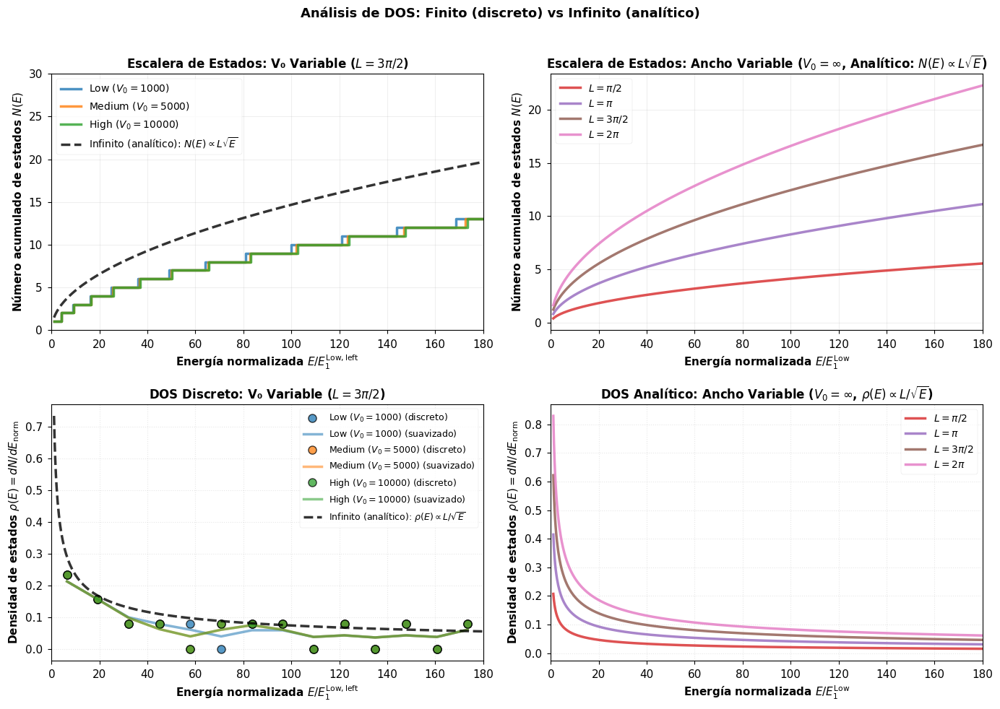

✓ Análisis de DOS discreto completado


In [ ]:
# Análisis de Densidad de Estados (DOS) - Discrete DOS por conteo en intervalos

def get_energies_varying_V0(x_grid, V0_values):
    """Calcula espectro de energías para diferentes potenciales (ancho fijo)."""
    spectra = {}
    for V0 in V0_values:
        V = get_potential(x_grid, V0)
        Es, _ = solve_schrodinger_numerov(x_grid, V)
        spectra[V0] = Es

    return spectra

def get_energies_varying_width(V0, n_states=50):
    """Calcula espectro de energías para diferentes anchos de pozo (potencial fijo)."""
    widths = [np.pi/2, np.pi, 3*np.pi/2, 2*np.pi]  # Variando el ancho
    spectra = {}

    for width in widths:
        # Crear grid adaptado al ancho
        x_min = -width/2
        x_max = 3*width/2
        x_grid = np.linspace(x_min, x_max, N_POINTS)

        V = get_potential(x_grid, V0)
        Es, _ = solve_schrodinger_numerov(x_grid, V)
        spectra[width] = Es[:n_states]

    return spectra

def compute_discrete_dos(energies, E_range, n_intervals):
    """
    Calcula DOS discreta contando estados en intervalos iguales de energía.

    DOS(E) = (número de estados en intervalo) / (ancho del intervalo)
    """
    E_min, E_max = E_range
    E_interval_width = (E_max - E_min) / n_intervals

    # Crear intervalos de energía iguales
    E_intervals = np.linspace(E_min, E_max, n_intervals + 1)
    E_centers = (E_intervals[:-1] + E_intervals[1:]) / 2

    # Contar estados en cada intervalo
    dos_values = np.zeros(n_intervals)
    for i in range(n_intervals):
        count = np.sum((energies >= E_intervals[i]) & (energies < E_intervals[i+1]))
        dos_values[i] = count / E_interval_width

    return E_centers, dos_values

def smooth_gaussian(values, sigma_bins=1.2):
    """Suavizado gaussiano discreto para visualización de DOS (no altera conteo)."""
    from scipy.ndimage import gaussian_filter1d
    return gaussian_filter1d(values, sigma=sigma_bins, mode='nearest')

def dos_infinite_analytical_normed(E_norm, width, E1_base, tiny=1e-6):
    """
    DOS analítica para pozo infinito 1D con normalización física exacta en unidades normalizadas.
    Fórmula: N(E) = (L/πħ)√(2mE) ⇒ dN/dE = (L/πħ)√(2m)/(2√E)
    En energía normalizada E_norm = E/E1_base:
      dN/dE_norm = dN/dE · dE/dE_norm = dN/dE · E1_base
                 = (L/πħ) · (√(2m)/2) · √(E1_base) · 1/√(E_norm)
    """
    const = (width / np.pi) * (np.sqrt(2 * MASS) / (2 * HBAR)) * np.sqrt(E1_base)
    return const / np.sqrt(np.maximum(E_norm, tiny))

def ladder_infinite_analytical(E_norm, width=np.pi, E1_base=None):
    """
    Escalera de estados analítica para pozo infinito: N(E) = (L/πħ)√(2mE)

    Parámetros:
    - E_norm: Energía normalizada por E1_base
    - width: ancho del pozo
    - E1_base: energía base para des-normalizar (si None usa E1_low global)
    """
    if E1_base is None:
        E1_local = SOLUTIONS['Low']['E'][0]
    else:
        E1_local = E1_base
    N_E = (width / np.pi) * (np.sqrt(2 * MASS) / HBAR) * np.sqrt(E1_local) * np.sqrt(np.maximum(E_norm, 0))
    return N_E

def energies_infinite_well(width, n_max=400):
    """
    Energías analíticas para pozo infinito de ancho 'width'
    E_n = n² π² ℏ² / (2m L²)
    """
    ns = np.arange(1, n_max + 1)
    E_inf = ns**2 * np.pi**2 * HBAR**2 / (2 * MASS * width**2)
    return E_inf

# Computar espectros
print("Calculando espectros para análisis de DOS discreto...")

# Ajustes combinados para mejorar convergencia:
# - Ancho más grande (3π/2) para densificar espectro
# - Más estados y mayor rango de energía
# - Bins adaptativos (12-14) + suavizado gaussiano visual

width_left = 1.5*np.pi
x_min_left = -width_left/2
x_max_left = 3*width_left/2
x_grid_left = np.linspace(x_min_left, x_max_left, N_POINTS)

V0_values = [1000.0, 5000.0, 10000.0]
# Resolver más estados en V0 variable
spectra_V0 = get_energies_varying_V0(x_grid_left, V0_values)

# Base de normalización para la columna izquierda: E1 del caso "Low" (V0=1000)
E1_left_low = spectra_V0[V0_values[0]][0]

# Energías analíticas para pozo infinito (ancho 3π/2) normalizadas con E1_left_low
E_infinite_width_left = energies_infinite_well(width=width_left, n_max=400)
E_infinite_width_left_norm = E_infinite_width_left / E1_left_low

# Espectros con ancho variable (V0 fijo, usamos Low = 10), más estados
spectra_width = get_energies_varying_width(V0=10.0, n_states=400)

# Espectros infinitos para cada ancho (normalizados por E1_low original)
spectra_width_infinite = {}
E1_low_global = SOLUTIONS['Low']['E'][0]
for width in [np.pi/2, np.pi, 3*np.pi/2, 2*np.pi]:
    E_inf = energies_infinite_well(width=width, n_max=400)
    spectra_width_infinite[width] = E_inf / E1_low_global

print("✓ Espectros calculados")

# Crear figura 2x2 para DOS
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

colors_v0 = ['#1f77b4', '#ff7f0e', '#2ca02c', 'black']
labels_v0 = ['Low ($V_0=1000$)', 'Medium ($V_0=5000$)', 'High ($V_0=10000$)', 'Infinito (analítico)']

colors_width = ['#d62728', '#9467bd', '#8c564b', '#e377c2']
width_labels = ['$L=π/2$', '$L=π$', '$L=3π/2$', '$L=2π$']

E_range = (0, 180)

# ============ TOP-LEFT: Escalera de Estados (V0 variable) ============
ax_ladder_v0 = axes[0, 0]

for V0, color, label in zip(V0_values, colors_v0[:3], labels_v0[:3]):
    Es = spectra_V0[V0][:400]
    Es_norm_left = Es / E1_left_low
    n_cumulative = np.arange(1, len(Es) + 1)
    ax_ladder_v0.step(Es_norm_left, n_cumulative, where='post', linewidth=2.5, color=color, label=label, alpha=0.8)

E_analytical = np.linspace(1, E_range[1], 700)
N_analytical = ladder_infinite_analytical(E_analytical, width=width_left, E1_base=E1_left_low)
ax_ladder_v0.plot(E_analytical, N_analytical, '--', linewidth=2.5, color='black',
                 label=labels_v0[3] + ': $N(E) \\propto L\\sqrt{E}$', alpha=0.8)

ax_ladder_v0.set_xlabel('Energía normalizada $E / E_1^{\\rm Low,left}$', fontsize=11, fontweight='bold')
ax_ladder_v0.set_ylabel('Número acumulado de estados $N(E)$', fontsize=11, fontweight='bold')
ax_ladder_v0.set_title('Escalera de Estados: V₀ Variable ($L = 3\\pi/2$)', fontsize=12, fontweight='bold')
ax_ladder_v0.legend(loc='upper left', fontsize=10)
ax_ladder_v0.grid(True, alpha=0.2)
ax_ladder_v0.set_xlim(E_range)
# Ajustar límite superior de N para mostrar toda la escalera
ax_ladder_v0.set_ylim(0, 30)
ax_ladder_v0.tick_params(labelsize=11)

# ============ TOP-RIGHT: Escalera de Estados (Ancho variable) - TODAS ANALÍTICAS ============
ax_ladder_width = axes[0, 1]

for width, color, label in zip([np.pi/2, np.pi, 3*np.pi/2, 2*np.pi], colors_width, width_labels):
    N_analytical_w = ladder_infinite_analytical(E_analytical, width=width, E1_base=E1_low_global)
    ax_ladder_width.plot(E_analytical, N_analytical_w, '-', linewidth=2.5,
                        color=color, label=label, alpha=0.8)

ax_ladder_width.set_xlabel('Energía normalizada $E / E_1^{\\rm Low}$', fontsize=11, fontweight='bold')
ax_ladder_width.set_ylabel('Número acumulado de estados $N(E)$', fontsize=11, fontweight='bold')
ax_ladder_width.set_title('Escalera de Estados: Ancho Variable ($V_0 = \\infty$, Analítico: $N(E) \\propto L\\sqrt{E}$)', fontsize=12, fontweight='bold')
ax_ladder_width.legend(loc='upper left', fontsize=10)
ax_ladder_width.grid(True, alpha=0.2)
ax_ladder_width.set_xlim(E_range)
ax_ladder_width.tick_params(labelsize=11)

# Helper para bins adaptativos
min_bins = 12
max_bins = 14

def choose_bins(n_levels):
    return int(np.clip(np.ceil(n_levels / 4), min_bins, max_bins))

# ============ BOTTOM-LEFT: DOS Discreto (V0 variable) ============
ax_dos_v0 = axes[1, 0]

for V0, color, label in zip(V0_values, colors_v0[:3], labels_v0[:3]):
    Es = spectra_V0[V0][:400]
    Es_norm_left = Es / E1_left_low
    n_intervals = choose_bins(len(Es_norm_left))
    E_centers, dos_vals = compute_discrete_dos(Es_norm_left, E_range, n_intervals)
    dos_vals_sm = smooth_gaussian(dos_vals, sigma_bins=0.8)
    ax_dos_v0.plot(E_centers, dos_vals, 'o', markersize=8,
                  color=color, label=label + ' (discreto)', alpha=0.75, markeredgecolor='black', markeredgewidth=1.0)
    ax_dos_v0.plot(E_centers, dos_vals_sm, '-', linewidth=2.5, color=color, alpha=0.55, label=label + ' (suavizado)')

E_analytical = np.linspace(1, E_range[1], 700)
dos_analytical = dos_infinite_analytical_normed(E_analytical, width=width_left, E1_base=E1_left_low)
ax_dos_v0.plot(E_analytical, dos_analytical, '--', linewidth=2.5,
              color='black', label=labels_v0[3] + ': $ρ(E) \\propto L/\\sqrt{E}$', alpha=0.8)

ax_dos_v0.set_xlabel('Energía normalizada $E / E_1^{\\rm Low,left}$', fontsize=11, fontweight='bold')
ax_dos_v0.set_ylabel('Densidad de estados $ρ(E) = dN/dE_{\\rm norm}$', fontsize=11, fontweight='bold')
ax_dos_v0.set_title('DOS Discreto: V₀ Variable ($L = 3\\pi/2$)', fontsize=12, fontweight='bold')
ax_dos_v0.legend(loc='upper right', fontsize=9)
ax_dos_v0.grid(True, alpha=0.3, linestyle=':', linewidth=0.8)
ax_dos_v0.tick_params(labelsize=11)
ax_dos_v0.set_xlim(E_range)

# ============ BOTTOM-RIGHT: DOS Analítico (Ancho variable) - TODAS ANALÍTICAS ============
ax_dos_width = axes[1, 1]

for width, color, label in zip([np.pi/2, np.pi, 3*np.pi/2, 2*np.pi], colors_width, width_labels):
    dos_analytical_w = dos_infinite_analytical_normed(E_analytical, width=width, E1_base=E1_low_global)
    ax_dos_width.plot(E_analytical, dos_analytical_w, '-', linewidth=2.5,
                     color=color, label=label, alpha=0.8)

ax_dos_width.set_xlabel('Energía normalizada $E / E_1^{\\rm Low}$', fontsize=11, fontweight='bold')
ax_dos_width.set_ylabel('Densidad de estados $ρ(E) = dN/dE_{\\rm norm}$', fontsize=11, fontweight='bold')
ax_dos_width.set_title('DOS Analítico: Ancho Variable ($V_0 = \\infty$, $ρ(E) \\propto L/\\sqrt{E}$)', fontsize=12, fontweight='bold')
ax_dos_width.legend(loc='upper right', fontsize=10)
ax_dos_width.grid(True, alpha=0.3, linestyle=':', linewidth=0.8)
ax_dos_width.tick_params(labelsize=11)
ax_dos_width.set_xlim(E_range)

fig.suptitle('Análisis de DOS: Finito (discreto) vs Infinito (analítico)',
             fontsize=13, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

print("✓ Análisis de DOS discreto completado")

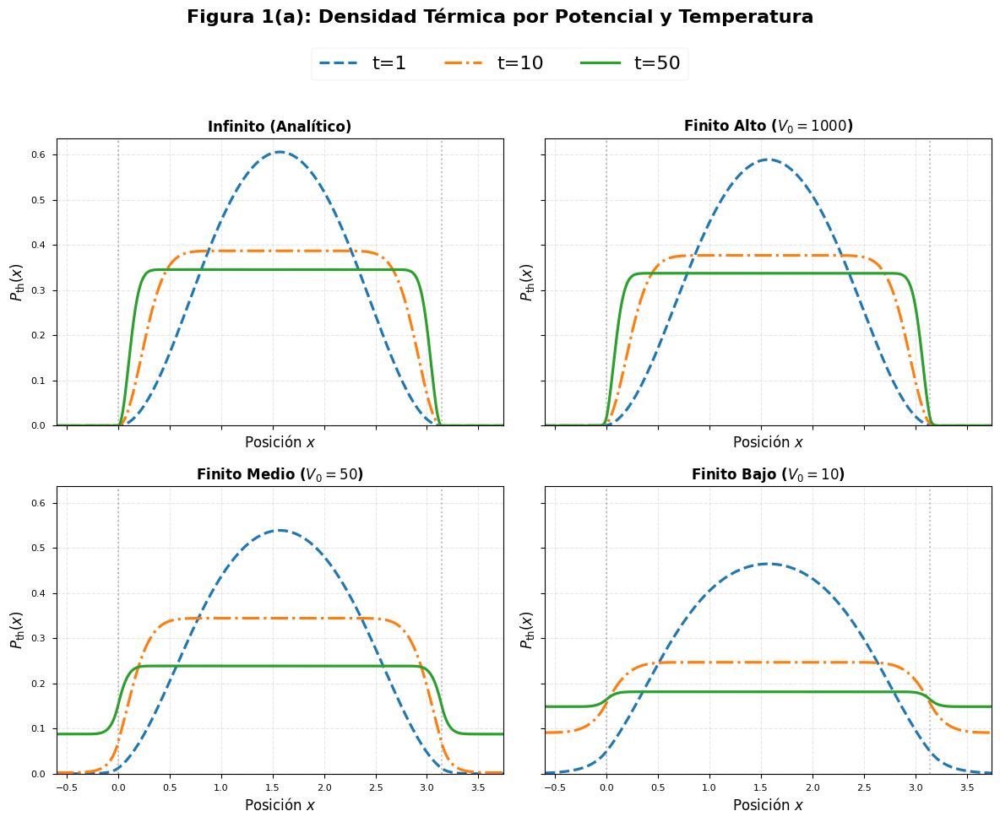

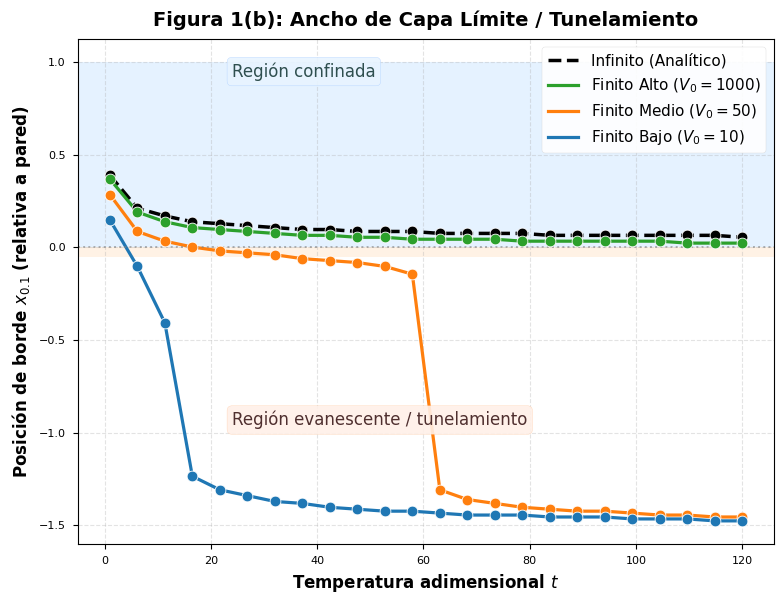

In [ ]:
# Figura 1: Comparación de Densidades Térmicas y Tunelamiento
# - (a) Cuatro subplots: Low, Medium, High, Infinito. Cada uno muestra curvas vs x para tres temperaturas.
# - (b) Ancho/tunelamiento vs t con estilo mejorado.

T_PLOT = [1, 10, 50]
x_plot = X_GRID

# Helper: P_th infinito analítico

def Pth_infinite(x, t, n_terms=60):
    n_vals = np.arange(1, n_terms + 1)
    weights = np.exp(-(n_vals**2 - 1) / t)
    phi_vals = np.array([phi_infinite(n, x) for n in n_vals])
    num = np.sum(weights[:, None] * phi_vals**2, axis=0)
    den = np.sum(weights)
    return num / den

# --- Figura 1(a): 4 subplots (temperaturas dentro de cada potencial) ---
fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True, sharey=True)
axes = axes.ravel()

def plot_panel(ax, label, color_cycle, solver_key=None):
    lines = []
    for t_val, style in zip(T_PLOT, ['--', '-.', '-']):
        if solver_key is None:  # infinito
            P = Pth_infinite(x_plot, t_val)
        else:
            sol = SOLUTIONS[solver_key]
            P = calc_thermal_density(x_plot, sol['E'], sol['Psi'], t_val)
        ln, = ax.plot(x_plot, P, linestyle=style, linewidth=2.3, color=color_cycle[t_val], label=f"t={t_val}")
        lines.append(ln)
    ax.set_title(label, fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)
    ax.axvline(0, color='gray', linestyle=':', alpha=0.5)
    ax.axvline(np.pi, color='gray', linestyle=':', alpha=0.5)
    return lines

color_map = {1: '#1f77b4', 10: '#ff7f0e', 50: '#2ca02c'}

legend_lines = plot_panel(axes[0], 'Infinito (Analítico)', color_map, None)
plot_panel(axes[1], 'Finito Alto ($V_0=1000$)', color_map, 'High')
plot_panel(axes[2], 'Finito Medio ($V_0=50$)', color_map, 'Medium')
plot_panel(axes[3], 'Finito Bajo ($V_0=10$)', color_map, 'Low')

for ax in axes:
    ax.set_xlim(-0.6, np.pi + 0.6)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Posición $x$')
    ax.set_ylabel('$P_{\\rm th}(x)$')

fig.legend(legend_lines, [ln.get_label() for ln in legend_lines], loc='upper center', ncol=3,
          frameon=True, framealpha=0.9, bbox_to_anchor=(0.5, 1.04), fontsize=16)
fig.suptitle('Figura 1(a): Densidad Térmica por Potencial y Temperatura', fontsize=16, fontweight='bold', y=1.08)
plt.tight_layout()
plt.show()

# --- Figura 1(b): Tunelamiento / ancho de capa límite con estilo mejorado ---
ts = np.linspace(1, 120, 24)
results_width = {k: [] for k in ['Low', 'Medium', 'High', 'Infinite']}

for t in ts:
    # Infinito
    P_i = Pth_infinite(x_plot, t)
    mask_left = (x_plot >= 0) & (x_plot <= np.pi/2)
    x_sub = x_plot[mask_left]
    P_sub = P_i[mask_left]
    if np.any(P_sub >= 0.1):
        idx = np.argmax(P_sub >= 0.1)
        d_inf = x_sub[idx]
    else:
        d_inf = np.nan
    results_width['Infinite'].append(d_inf)

    # Finitos
    for key in ['Low', 'Medium', 'High']:
        sol = SOLUTIONS[key]
        P_f = calc_thermal_density(x_plot, sol['E'], sol['Psi'], t)
        mask_search = (x_plot > -1.5) & (x_plot < np.pi/2)
        x_s = x_plot[mask_search]
        P_s = P_f[mask_search]
        if np.max(P_s) < 0.1:
            d_val = np.nan
        else:
            idx_cross = np.argmax(P_s >= 0.1)
            d_val = x_s[idx_cross]
        results_width[key].append(d_val)

fig, ax = plt.subplots(figsize=(8, 6.2))

# Fondos suaves para zonas
ax.axhspan(0, ax.get_ylim()[1] if ax.get_ylim()[1] > 0 else 0.2, facecolor='#d0e8ff', alpha=0.55, zorder=0)
ax.axhspan(ax.get_ylim()[0] if ax.get_ylim()[0] < 0 else -0.2, 0, facecolor='#ffe8d0', alpha=0.55, zorder=0)

ax.plot(ts, results_width['Infinite'], color='black', linestyle='--', linewidth=2.5, label='Infinito (Analítico)')
ax.plot(ts, results_width['High'], color='#2ca02c', linewidth=2.3, label='Finito Alto ($V_0=1000$)')
ax.plot(ts, results_width['Medium'], color='#ff7f0e', linewidth=2.3, label='Finito Medio ($V_0=50$)')
ax.plot(ts, results_width['Low'], color='#1f77b4', linewidth=2.3, label='Finito Bajo ($V_0=10$)')

# Puntos donde se evaluó realmente el cruce
for key, color in [('Infinite', 'black'), ('High', '#2ca02c'), ('Medium', '#ff7f0e'), ('Low', '#1f77b4')]:
    ys = np.array(results_width[key])
    xs = ts[~np.isnan(ys)]
    ys = ys[~np.isnan(ys)]
    ax.scatter(xs, ys, color=color, edgecolors='white', linewidths=0.6, zorder=4, s=60)

ax.set_xlabel('Temperatura adimensional $t$', fontsize=12, fontweight='bold')
ax.set_ylabel('Posición de borde $x_{0.1}$ (relativa a pared)', fontsize=12, fontweight='bold')
ax.axhline(0, color='gray', linestyle=':', alpha=0.6)

# Anotaciones con bloques suaves
ax.text(ts[-1]*0.2, ax.get_ylim()[1]*0.82, 'Región confinada', fontsize=12, color='#2f4f4f',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='#e8f4ff', edgecolor='#a0c8ff', alpha=0.9))
ax.text(ts[-1]*0.2, ax.get_ylim()[0]*0.6, 'Región evanescente / tunelamiento', fontsize=12, color='#4f2f2f',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='#fff0e8', edgecolor='#ffc8a0', alpha=0.9))

ax.set_title('Figura 1(b): Ancho de Capa Límite / Tunelamiento', fontsize=14, fontweight='bold', pad=10)
ax.grid(True, alpha=0.35, linestyle='--', linewidth=0.8)
ax.legend(frameon=True, framealpha=0.9, fontsize=11)
plt.tight_layout()
plt.show()


In [ ]:
# Potenciales suaves alternativos: armónico truncado y cuña en V

def potential_harmonic_finite(x, V0=60.0, omega=2.2, center=np.pi/2):
    """Pozo armónico truncado a V0 para mantener barreras finitas."""
    V_soft = 0.5 * MASS * omega**2 * (x - center)**2
    return np.minimum(V_soft, V0)


def potential_vshape_finite(x, V0=60.0, slope=28.0, center=np.pi/2):
    """Pozo en V (lineal) truncado a V0 para evitar paredes infinitas."""
    V_soft = slope * np.abs(x - center)
    return np.minimum(V_soft, V0)


ALT_POTENTIALS = {
    'Harmonic': {
        'label': 'Armónico finito (truncado)',
        'V0': 60.0,
        'omega': 2.2,
        'center': np.pi / 2
    },
    'VShape': {
        'label': 'Pozo en V finito (truncado)',
        'V0': 60.0,
        'slope': 28.0,
        'center': np.pi / 2
    }
}

ALT_SOLUTIONS = {}
print("Calculando soluciones para pozos suaves (armónico y V)...")
for key, cfg in ALT_POTENTIALS.items():
    if key == 'Harmonic':
        V_alt = potential_harmonic_finite(
            X_GRID, V0=cfg['V0'], omega=cfg['omega'], center=cfg['center']
        )
    else:
        V_alt = potential_vshape_finite(
            X_GRID, V0=cfg['V0'], slope=cfg['slope'], center=cfg['center']
        )
    Es_alt, Psis_alt = solve_schrodinger_numerov(X_GRID, V_alt)
    ALT_SOLUTIONS[key] = {'E': Es_alt, 'Psi': Psis_alt, 'V': V_alt, 'x': X_GRID, 'label': cfg['label']}
    print(f"  {cfg['label']}: {len(Es_alt)} estados, E1 = {Es_alt[0]:.3f}")

# Mapa unificado para reutilizar funciones de dos partículas
ALL_SOLUTIONS = {**SOLUTIONS, **ALT_SOLUTIONS}


def get_basis_state(sol_key, n):
    """Retorna (E_n, psi_n(x)) para un potencial dado, usando 1-indexing."""
    if sol_key == 'Infinite':
        psi_n = phi_infinite(n, X_GRID)
        E_n = E_infinite(n)
    elif sol_key in ALL_SOLUTIONS:
        sol = ALL_SOLUTIONS[sol_key]
        psi_n = sol['Psi'][:, n - 1]
        E_n = sol['E'][n - 1]
    else:
        raise ValueError(f"Potencial desconocido: {sol_key}")
    return E_n, psi_n


def get_pair_prob(n1, n2, particle_type, sol_key):
    """Probabilidad |Ψ(x1,x2)|^2 simetrizada/antisimetrizada para n1,n2."""
    _, psi1 = get_basis_state(sol_key, n1)
    _, psi2 = get_basis_state(sol_key, n2)
    base = np.outer(psi1, psi2)
    if particle_type == 'boson':
        psi_pair = base if n1 == n2 else (base + base.T) / np.sqrt(2)
    else:  # fermion
        psi_pair = np.zeros_like(base) if n1 == n2 else (base - base.T) / np.sqrt(2)
    return psi_pair**2


def calc_thermal_2p(t, stat_key, sol_key, nmax=20):
    """Densidad térmica de dos partículas para un potencial y estadística dada."""
    mixes = {
        'boson': [('boson', 1.0)],
        'fermion': [('fermion', 1.0)],
        'spin1/2': [('boson', 0.25), ('fermion', 0.75)],
        'spin1': [('boson', 2/3), ('fermion', 1/3)]
    }
    # Número de estados disponibles
    if sol_key == 'Infinite':
        n_terms = nmax
    else:
        n_terms = min(nmax, len(ALL_SOLUTIONS[sol_key]['E']))
    energies = [get_basis_state(sol_key, n)[0] for n in range(1, n_terms + 1)]
    E0 = energies[0]
    P_accum = np.zeros((len(X_GRID), len(X_GRID)))
    Z = 0.0
    for i in range(n_terms):
        for j in range(n_terms):
            weight = np.exp(-((energies[i] + energies[j] - 2 * E0) / t))
            Z += weight
            for kind, frac in mixes[stat_key]:
                P_accum += frac * weight * get_pair_prob(i + 1, j + 1, kind, sol_key)
    return P_accum / Z

print("✓ Potenciales suaves listos para comparaciones térmicas")


Calculando soluciones para pozos suaves (armónico y V)...
  Armónico finito (truncado): 598 estados, E1 = 1.100
  Pozo en V finito (truncado): 598 estados, E1 = 9.395
✓ Potenciales suaves listos para comparaciones térmicas


## Figuras 2-3: Estados de Dos Partículas (Comparativa)

Comparamos visualmente las densidades de probabilidad para pares de estados específicos de dos partículas ($n_1, n_2$).

**Izquierda**: Pozo Infinito (Analítico) - Confinamiento perfecto en $[0, \pi]$.
**Derecha**: Pozo Finito Bajo ($V_0=10$, Numérico) - Muestra tunelamiento y deslocalización, especialmente para estados excitados con $E > V_0$.

Nota: Para el caso finito, usamos los estados propios numéricos $k=n_1$ y $k=n_2$ ordenados por energía. Para estados altos ($n=5$), $E_5$ puede exceder $V_0$, resultando en estados del continuo extendidos por todo el dominio de simulación.

### Definición de Densidades
- **Bosones**: Simetrizado $\Psi_S \propto \phi_{n1}(x_1)\phi_{n2}(x_2) + \phi_{n1}(x_2)\phi_{n2}(x_1)$
- **Fermiones**: Antisimetrizado $\Psi_A \propto \phi_{n1}(x_1)\phi_{n2}(x_2) - \phi_{n1}(x_2)\phi_{n2}(x_1)$

Figura 2 (Heatmap): Bosones - Comparativa 2x2


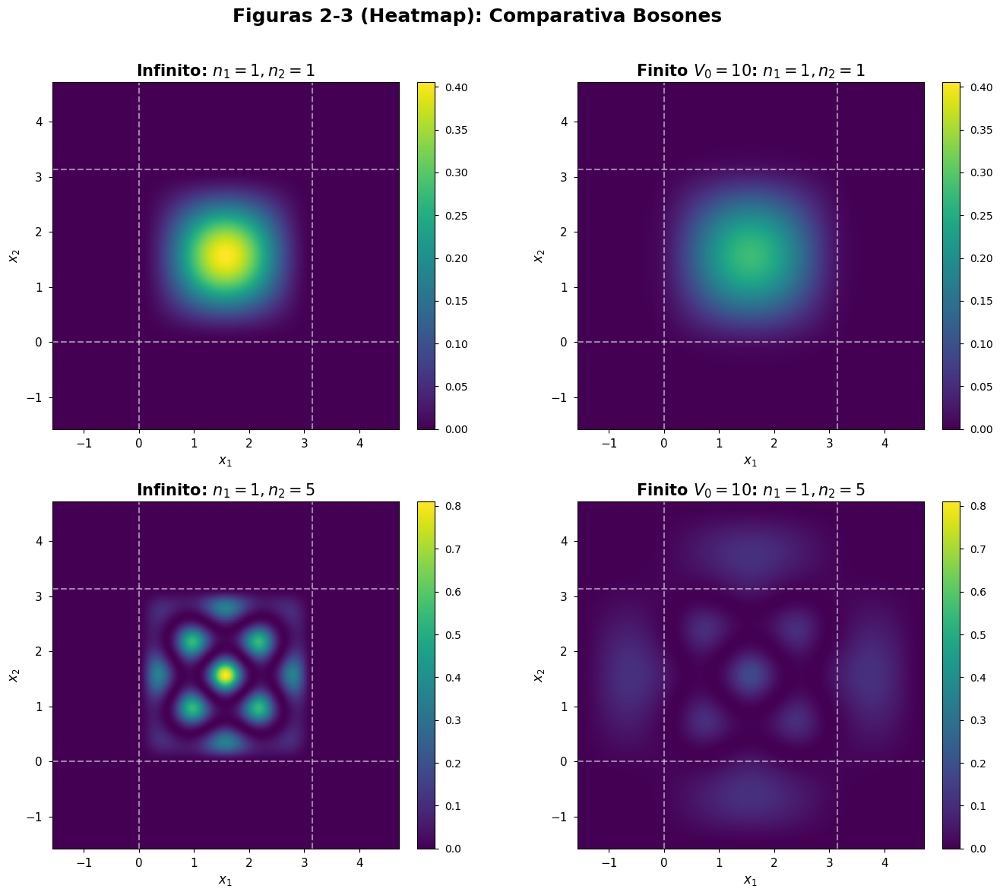


Figura 3 (Heatmap): Fermiones - Comparativa 2x2


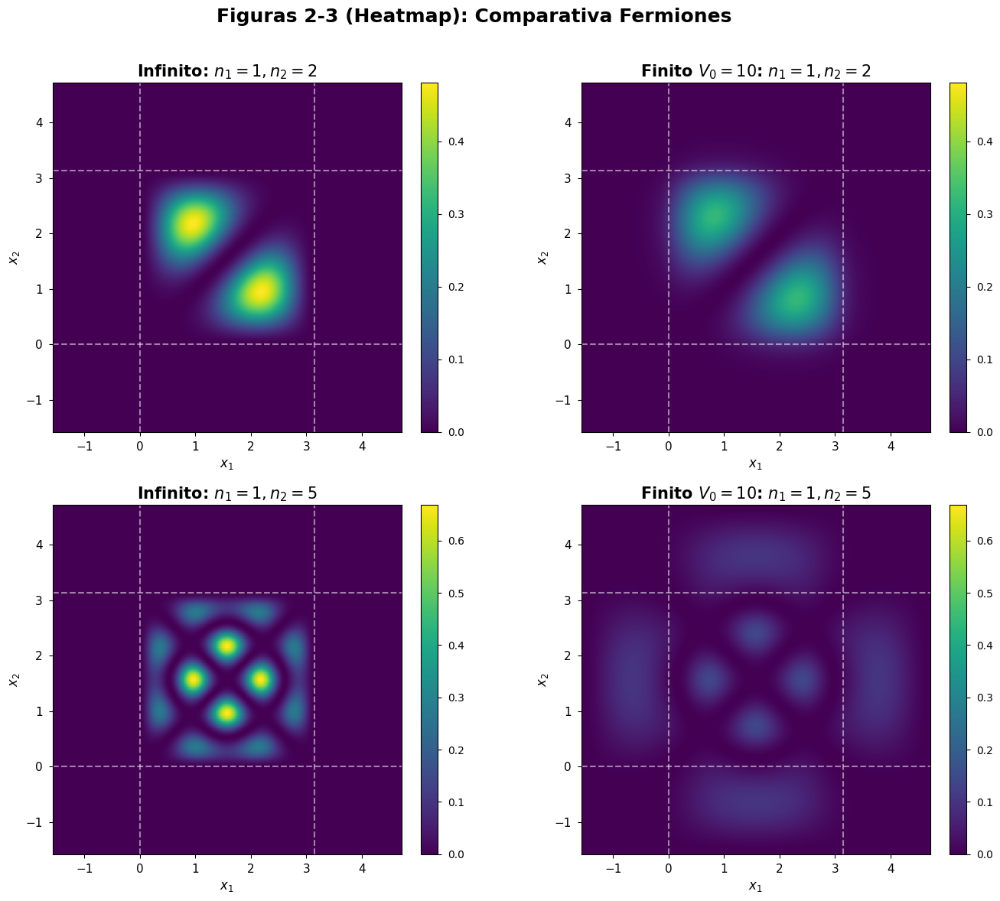

In [ ]:
def plot_heatmap_grid_comparison(type_p, sol_key='Low'):
    """
    Crea una comparación 2x2 en heatmap para bosones o fermiones:
    - Columna izquierda: Infinito
    - Columna derecha: Finito
    - Fila superior: (n1=1, n2=1) para bosones o (n1=1, n2=2) para fermiones
    - Fila inferior: (n1=1, n2=5) para ambos casos
    """
    # Determinar estados según tipo de partícula
    if type_p == 'boson':
        states = [(1, 1), (1, 5)]
        title_main = 'Bosones'
    else:  # fermion
        states = [(1, 2), (1, 5)]
        title_main = 'Fermiones'

    # Crear figura 2x2 con subplots de heatmap
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Calcular probabilidades
        P_inf = get_pair_prob(n1, n2, type_p, 'Infinite')
        P_fin = get_pair_prob(n1, n2, type_p, sol_key)

        # Encontrar vmax común para la fila
        vmax = max(np.max(P_inf), np.max(P_fin))

        # Subplot izquierdo (Infinito)
        ax_inf = axes[row_idx, 0]
        im_inf = ax_inf.pcolormesh(X_GRID, X_GRID, P_inf, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_inf.set_title(f'Infinito: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_inf.set_aspect('equal')
        ax_inf.set_xlabel('$x_1$', fontsize=12)
        ax_inf.set_ylabel('$x_2$', fontsize=12)
        ax_inf.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_inf.axvline(l, color='w', linestyle='--', alpha=0.5, linewidth=1.5)
            ax_inf.axhline(l, color='w', linestyle='--', alpha=0.5, linewidth=1.5)

        # Subplot derecho (Finito)
        ax_fin = axes[row_idx, 1]
        im_fin = ax_fin.pcolormesh(X_GRID, X_GRID, P_fin, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_fin.set_title(f'Finito $V_0=10$: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_fin.set_aspect('equal')
        ax_fin.set_xlabel('$x_1$', fontsize=12)
        ax_fin.set_ylabel('$x_2$', fontsize=12)
        ax_fin.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_fin.axvline(l, color='w', linestyle='--', alpha=0.5, linewidth=1.5)
            ax_fin.axhline(l, color='w', linestyle='--', alpha=0.5, linewidth=1.5)

        # Añadir colorbars individuales
        cbar_inf = fig.colorbar(im_inf, ax=ax_inf, fraction=0.046, pad=0.04)
        cbar_inf.ax.tick_params(labelsize=10)
        cbar_fin = fig.colorbar(im_fin, ax=ax_fin, fraction=0.046, pad=0.04)
        cbar_fin.ax.tick_params(labelsize=10)

    fig.suptitle(f'Figuras 2-3 (Heatmap): Comparativa {title_main}',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Figura 2: Bosones (Heatmap)
print("Figura 2 (Heatmap): Bosones - Comparativa 2x2")
plot_heatmap_grid_comparison('boson', sol_key='Low')

# Figura 3: Fermiones (Heatmap)
print("\nFigura 3 (Heatmap): Fermiones - Comparativa 2x2")
plot_heatmap_grid_comparison('fermion', sol_key='Low')

Figura 2 (3D): Bosones - Comparativa 2x2


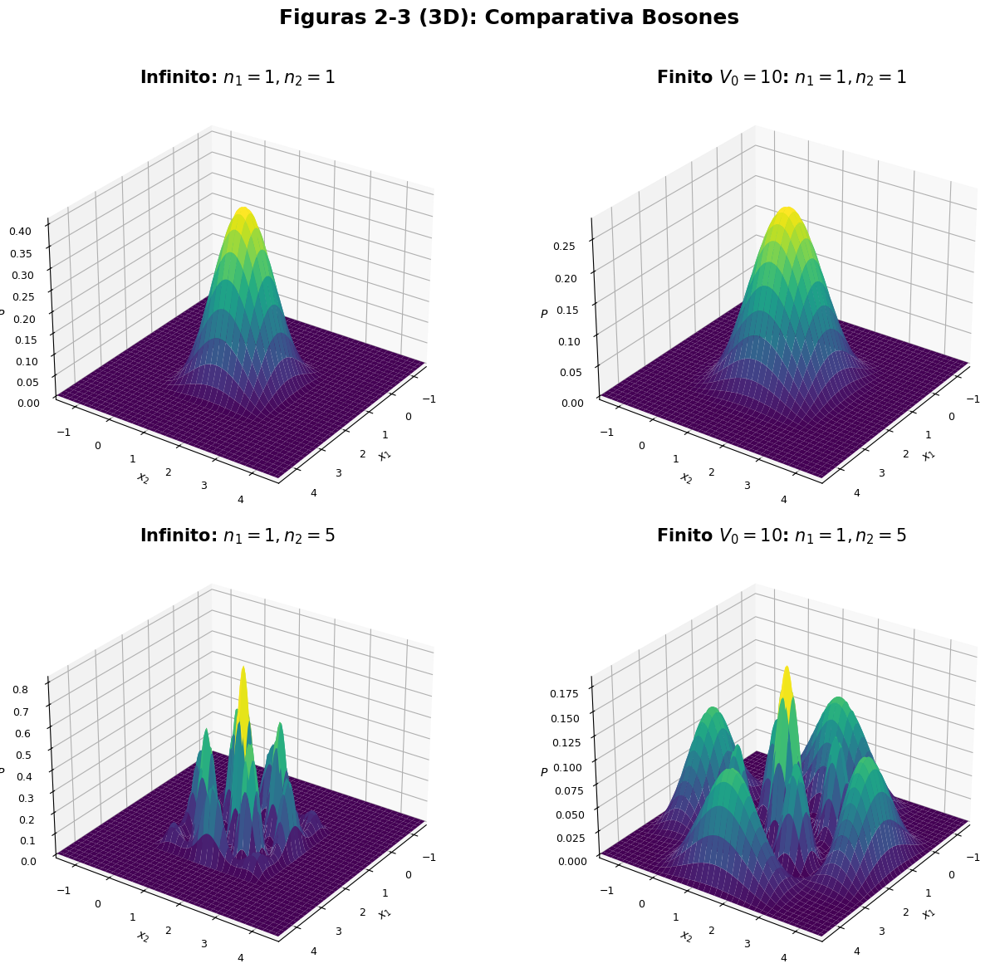


Figura 3 (3D): Fermiones - Comparativa 2x2


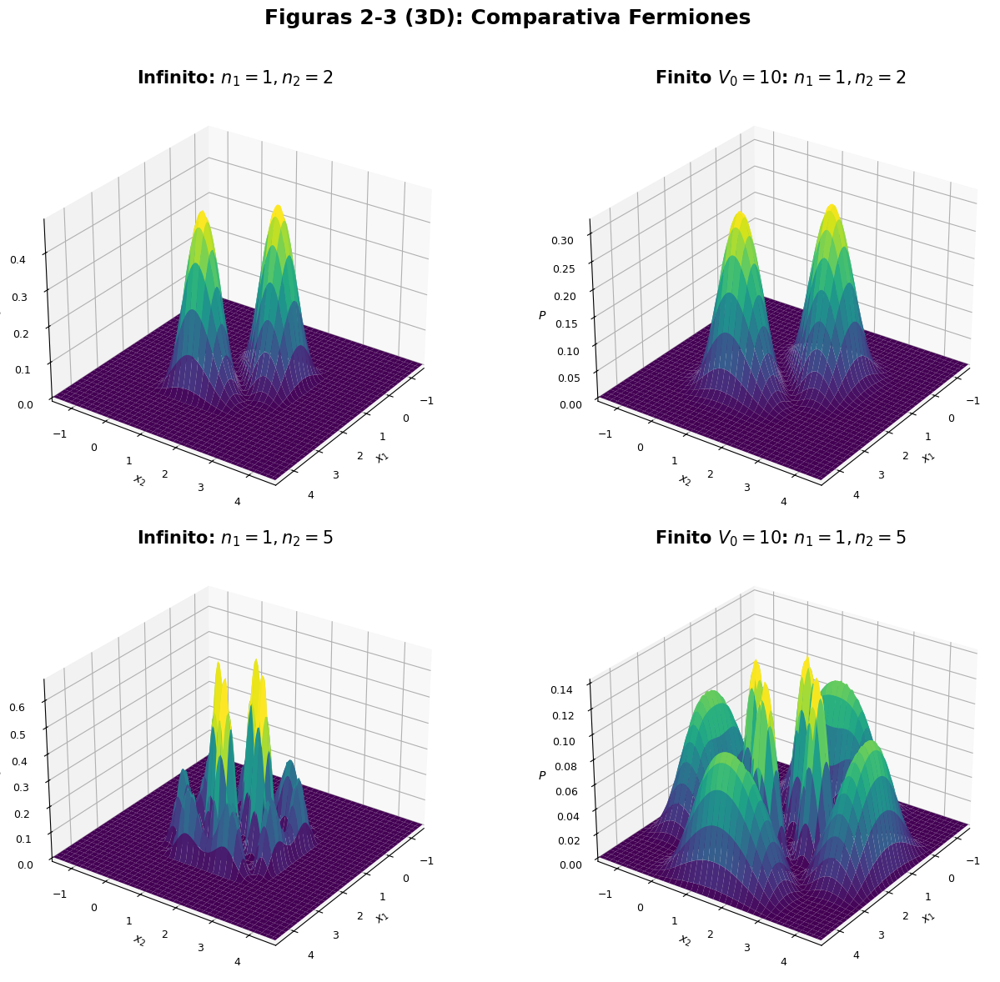

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def plot_3d_grid_comparison(type_p, sol_key='Low', ds=5):
    """
    Crea una comparación 2x2 para bosones o fermiones:
    - Columna izquierda: Infinito
    - Columna derecha: Finito
    - Fila superior: (n1=1, n2=1) para bosones o (n1=1, n2=2) para fermiones
    - Fila inferior: (n1=1, n2=5) para ambos casos
    """
    # Downsample grid to speed up surface rendering
    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)

    # Determinar estados según tipo de partícula
    if type_p == 'boson':
        states = [(1, 1), (1, 5)]
        title_main = 'Bosones'
    else:  # fermion
        states = [(1, 2), (1, 5)]
        title_main = 'Fermiones'

    # Crear figura 2x2 con subplots 3D
    fig = plt.figure(figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Calcular probabilidades
        P_inf_full = get_pair_prob(n1, n2, type_p, 'Infinite')
        P_inf = P_inf_full[::ds, ::ds]

        P_fin_full = get_pair_prob(n1, n2, type_p, sol_key)
        P_fin = P_fin_full[::ds, ::ds]

        # Subplot izquierdo (Infinito)
        ax_inf = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_inf.plot_surface(X1, X2, P_inf, cmap='viridis', linewidth=0, antialiased=True)
        ax_inf.set_title(f'Infinito: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_inf.set_xlabel('$x_1$', fontsize=10)
        ax_inf.set_ylabel('$x_2$', fontsize=10)
        ax_inf.set_zlabel('$P$', fontsize=10)
        ax_inf.tick_params(axis='both', labelsize=9)
        ax_inf.view_init(elev=28, azim=35)
        ax_inf.set_xlim(X_MIN, X_MAX)
        ax_inf.set_ylim(X_MIN, X_MAX)

        # Subplot derecho (Finito)
        ax_fin = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_fin.plot_surface(X1, X2, P_fin, cmap='viridis', linewidth=0, antialiased=True)
        ax_fin.set_title(f'Finito $V_0=10$: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_fin.set_xlabel('$x_1$', fontsize=10)
        ax_fin.set_ylabel('$x_2$', fontsize=10)
        ax_fin.set_zlabel('$P$', fontsize=10)
        ax_fin.tick_params(axis='both', labelsize=9)
        ax_fin.view_init(elev=28, azim=35)
        ax_fin.set_xlim(X_MIN, X_MAX)
        ax_fin.set_ylim(X_MIN, X_MAX)

    fig.suptitle(f'Figuras 2-3 (3D): Comparativa {title_main}',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("Figura 2 (3D): Bosones - Comparativa 2x2")
plot_3d_grid_comparison('boson', sol_key='Low', ds=5)

print("\nFigura 3 (3D): Fermiones - Comparativa 2x2")
plot_3d_grid_comparison('fermion', sol_key='Low', ds=5)

## Figuras 2bis-3bis: Pares de Estados en Pozos Suaves (Comparativa)

Análogo a las Figuras 2-3 originales, ahora comparamos densidades de dos partículas para pares de estados específicos ($n_1, n_2$) en los pozos suaves: **armónico finito** vs **pozo en V finito**.

**Izquierda**: Armónico truncado—comportamiento gaussiano suave cerca del mínimo, colas suavizadas por la barrera finita.
**Derecha**: Pozo en V truncado—forma de "tienda" lineal, cusps suavizados por Numerov, mayor extensión en los extremos.

Se muestran casos para **Bosones** y **Fermiones** sin mezcla de espín (pura simetrización espacial).


Figura 2bis (Heatmap): Bosones - Armónico vs Pozo en V


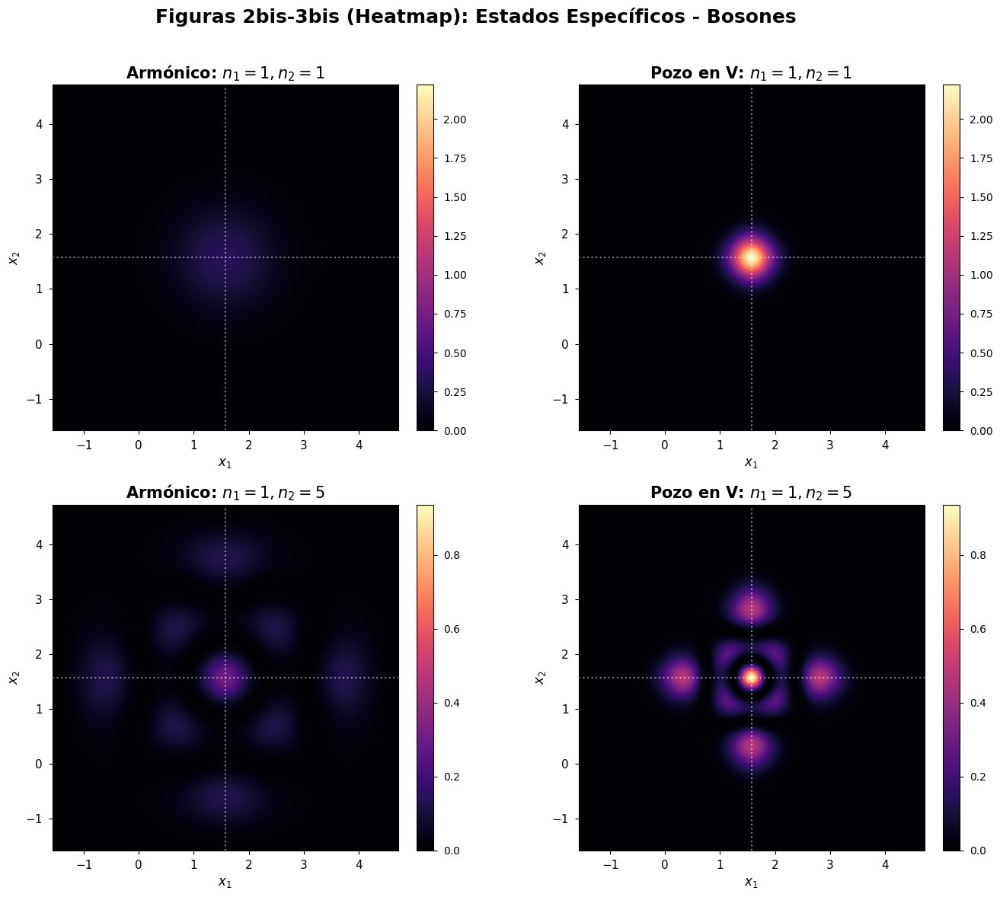


Figura 3bis (Heatmap): Fermiones - Armónico vs Pozo en V


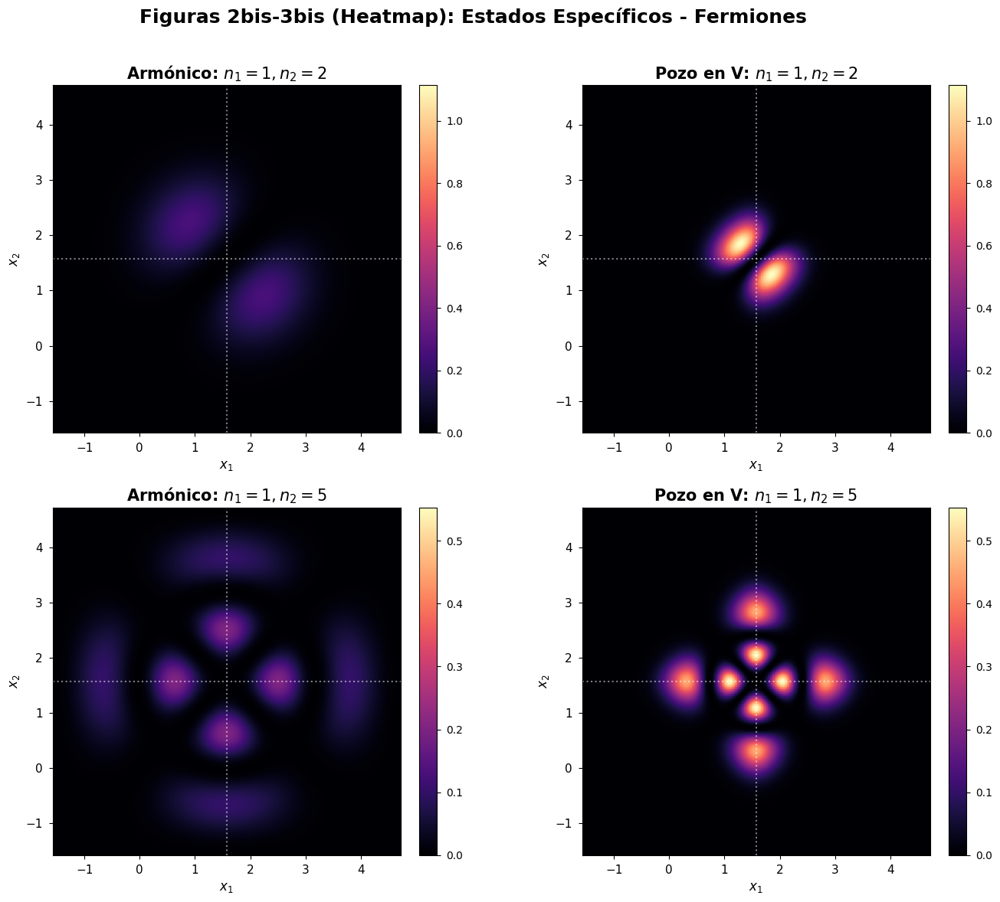

In [ ]:
def plot_soft_pair_heatmap(type_p='boson'):
    """Comparativa 2x2 de pares específicos (n1,n2) para armónico vs V."""
    if type_p == 'boson':
        states = [(1, 1), (1, 5)]
        title_main = 'Bosones'
    else:
        states = [(1, 2), (1, 5)]
        title_main = 'Fermiones'

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        P_harm = get_pair_prob(n1, n2, type_p, 'Harmonic')
        P_vshape = get_pair_prob(n1, n2, type_p, 'VShape')
        vmax = max(np.max(P_harm), np.max(P_vshape))

        # Armónico
        ax_h = axes[row_idx, 0]
        im_h = ax_h.pcolormesh(X_GRID, X_GRID, P_harm, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_h.set_title(f'Armónico: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_h.set_aspect('equal')
        ax_h.set_xlabel('$x_1$', fontsize=12)
        ax_h.set_ylabel('$x_2$', fontsize=12)
        ax_h.axvline(np.pi/2, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_h.axhline(np.pi/2, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_h.tick_params(labelsize=11)

        # Pozo en V
        ax_v = axes[row_idx, 1]
        im_v = ax_v.pcolormesh(X_GRID, X_GRID, P_vshape, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_v.set_title(f'Pozo en V: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_v.set_aspect('equal')
        ax_v.set_xlabel('$x_1$', fontsize=12)
        ax_v.set_ylabel('$x_2$', fontsize=12)
        ax_v.axvline(np.pi/2, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_v.axhline(np.pi/2, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_v.tick_params(labelsize=11)

        cbar_h = fig.colorbar(im_h, ax=ax_h, fraction=0.046, pad=0.04)
        cbar_h.ax.tick_params(labelsize=10)
        cbar_v = fig.colorbar(im_v, ax=ax_v, fraction=0.046, pad=0.04)
        cbar_v.ax.tick_params(labelsize=10)

    fig.suptitle(f'Figuras 2bis-3bis (Heatmap): Estados Específicos - {title_main}',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("Figura 2bis (Heatmap): Bosones - Armónico vs Pozo en V")
plot_soft_pair_heatmap('boson')

print("\nFigura 3bis (Heatmap): Fermiones - Armónico vs Pozo en V")
plot_soft_pair_heatmap('fermion')


Figura 2bis (3D): Bosones - Armónico vs Pozo en V


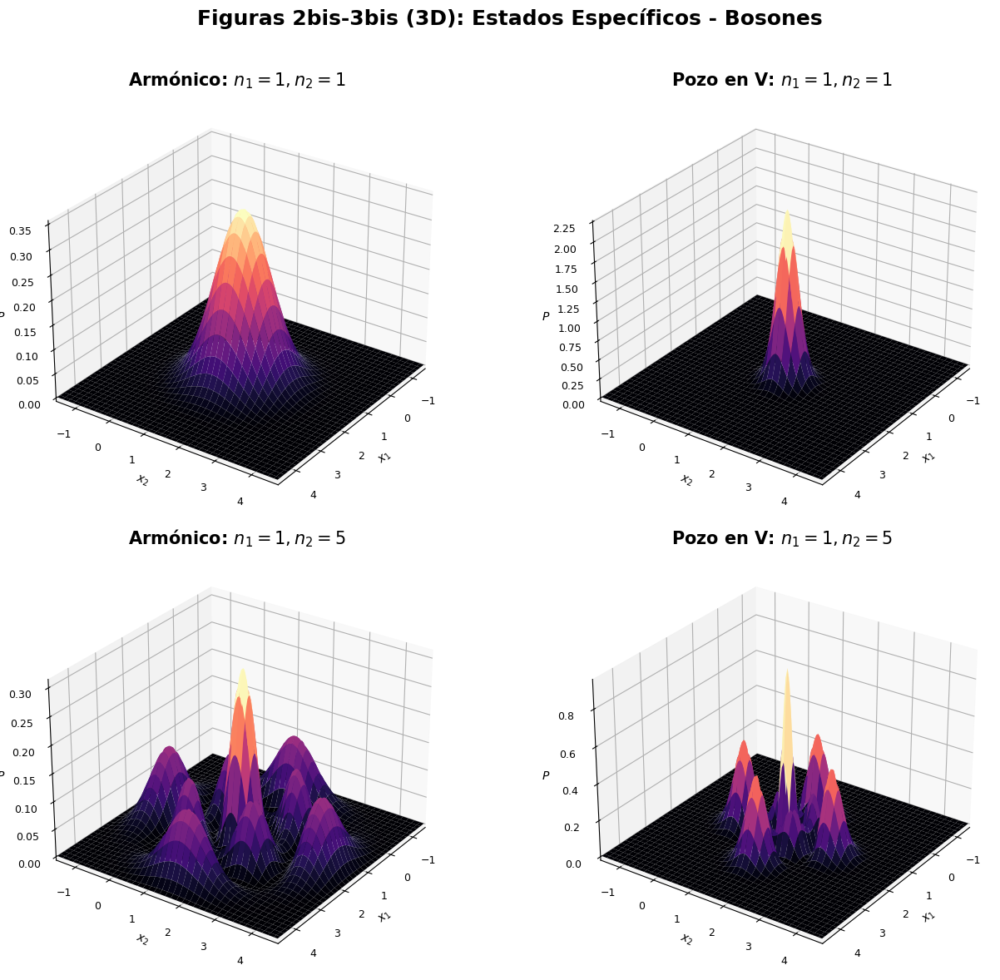


Figura 3bis (3D): Fermiones - Armónico vs Pozo en V


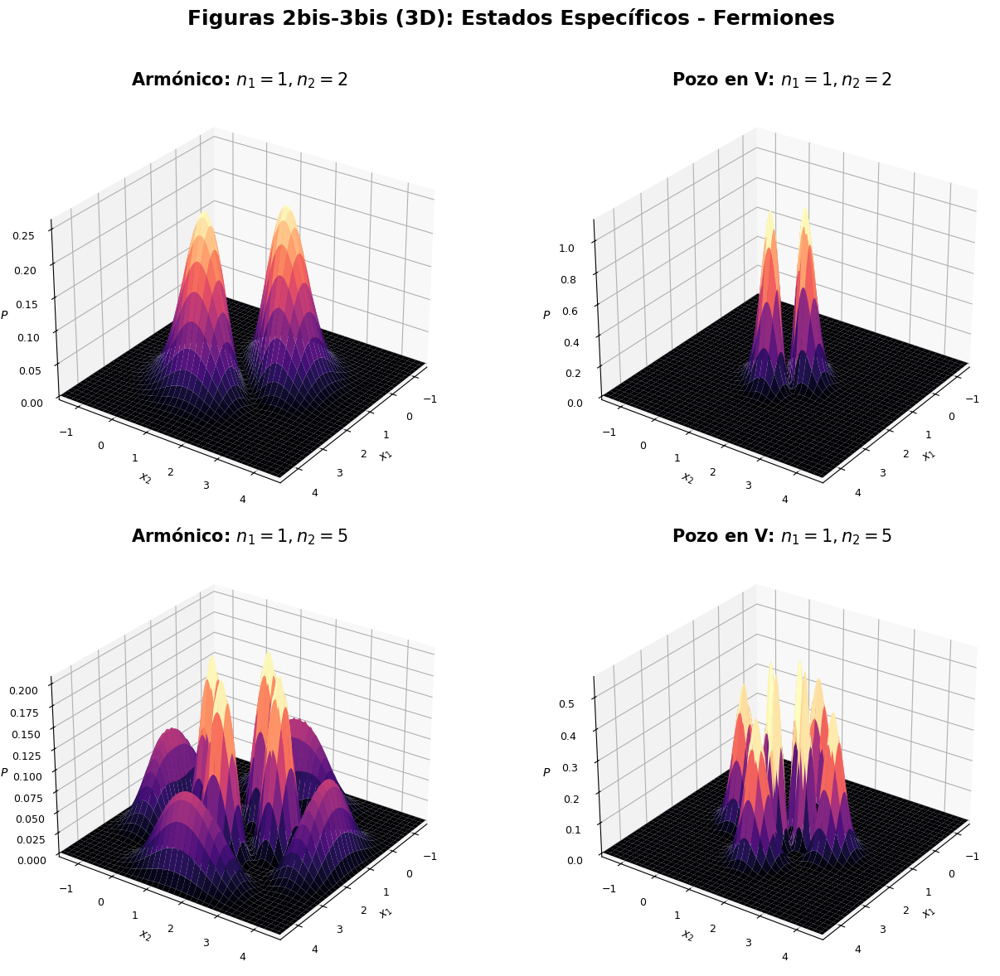

In [ ]:
def plot_soft_pair_3d(type_p='boson', ds=5):
    """Comparativa 3D de pares específicos (n1,n2) para armónico vs V."""
    if type_p == 'boson':
        states = [(1, 1), (1, 5)]
        title_main = 'Bosones'
    else:
        states = [(1, 2), (1, 5)]
        title_main = 'Fermiones'

    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)
    fig = plt.figure(figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        P_harm = get_pair_prob(n1, n2, type_p, 'Harmonic')[::ds, ::ds]
        P_vshape = get_pair_prob(n1, n2, type_p, 'VShape')[::ds, ::ds]

        # Armónico
        ax_h = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_h.plot_surface(X1, X2, P_harm, cmap='magma', linewidth=0, antialiased=True)
        ax_h.set_title(f'Armónico: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_h.set_xlabel('$x_1$', fontsize=10)
        ax_h.set_ylabel('$x_2$', fontsize=10)
        ax_h.set_zlabel('$P$', fontsize=10)
        ax_h.tick_params(axis='both', labelsize=9)
        ax_h.view_init(elev=28, azim=35)
        ax_h.set_xlim(X_MIN, X_MAX)
        ax_h.set_ylim(X_MIN, X_MAX)

        # Pozo en V
        ax_v = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_v.plot_surface(X1, X2, P_vshape, cmap='magma', linewidth=0, antialiased=True)
        ax_v.set_title(f'Pozo en V: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_v.set_xlabel('$x_1$', fontsize=10)
        ax_v.set_ylabel('$x_2$', fontsize=10)
        ax_v.set_zlabel('$P$', fontsize=10)
        ax_v.tick_params(axis='both', labelsize=9)
        ax_v.view_init(elev=28, azim=35)
        ax_v.set_xlim(X_MIN, X_MAX)
        ax_v.set_ylim(X_MIN, X_MAX)

    fig.suptitle(f'Figuras 2bis-3bis (3D): Estados Específicos - {title_main}',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


print("\nFigura 2bis (3D): Bosones - Armónico vs Pozo en V")
plot_soft_pair_3d('boson', ds=5)

print("\nFigura 3bis (3D): Fermiones - Armónico vs Pozo en V")
plot_soft_pair_3d('fermion', ds=5)


## Figura 4: Promedios Térmicos y Estadística de Espín

Calculamos la densidad térmica de dos partículas $P_{th}(x_1, x_2, T)$ sumando sobre todos los estados accesibles pesados por Boltzmann.

$$ P_{th} = \frac{1}{Z} \sum_{n_1, n_2} e^{-(E_{n_1}+E_{n_2})/t} \hat{P}_{n_1,n_2}(x_1,x_2) $$

Comparamos el caso **Infinito** (confinado) vs **Finito Bajo** (tunelamiento y evaporación).

- **Bosón**: Simétrico espacial.
- **Fermión (sin espín)**: Antisimétrico espacial.
- **Spin-1/2 (Fermión)**: $1/4$ Simétrico + $3/4$ Antisimétrico.
- **Spin-1 (Bosón)**: $2/3$ Simétrico + $1/3$ Antisimétrico.


Figura 4 (Heatmap): Promedios Térmicos - T=10.0
Comparativa 2x2: Bosones vs Fermiones


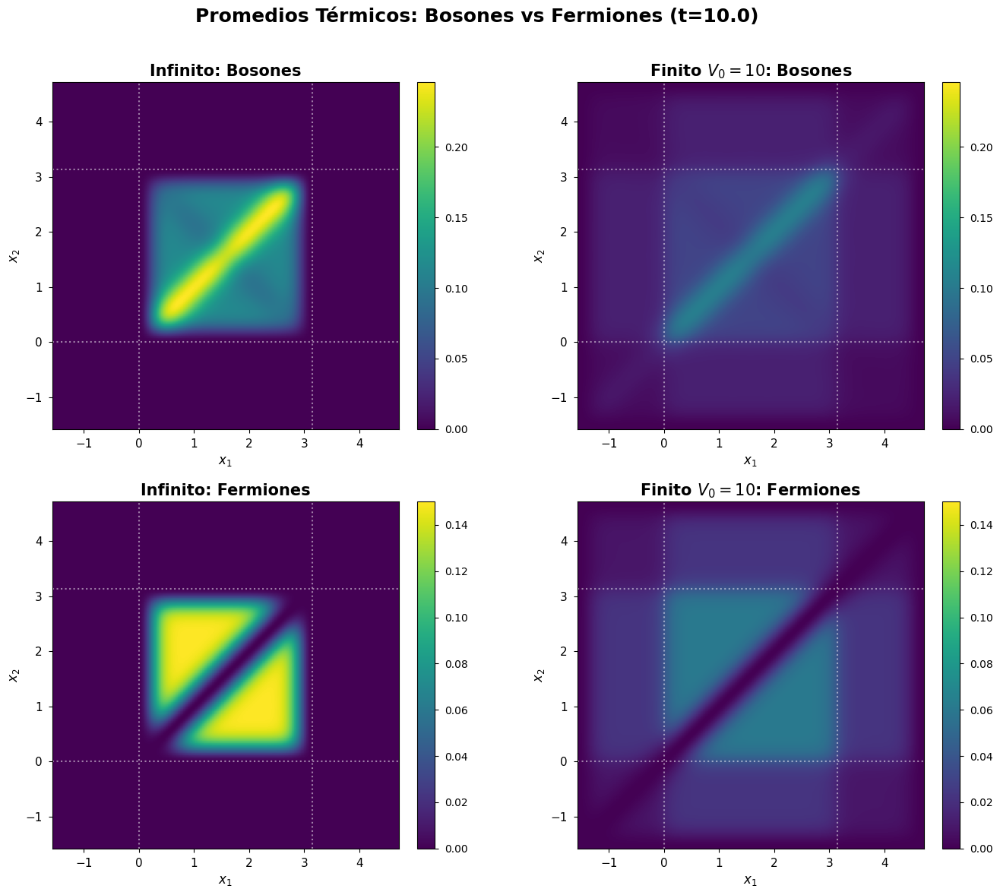


Comparativa 2x2: Spin-1/2 vs Spin-1


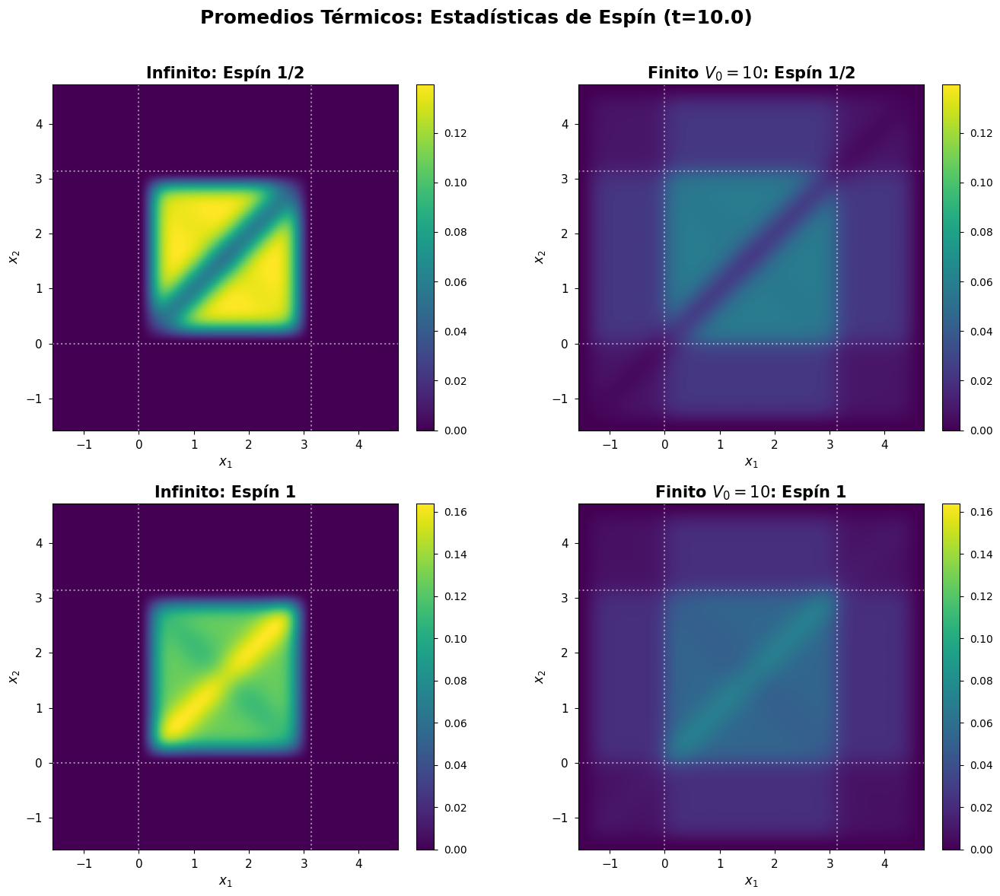

In [ ]:
def plot_thermal_heatmap_grid(type_s, t_val=10.0):
    """
    Crea una comparación 2x2 en heatmap para promedios térmicos:
    - Fila superior: bosón (izq: infinito, der: finito)
    - Fila inferior: fermión (izq: infinito, der: finito)
    O para spin cases:
    - Fila superior: spin1/2 (izq: infinito, der: finito)
    - Fila inferior: spin1 (izq: infinito, der: finito)
    """
    # Determinar qué estadísticas mostrar
    if type_s == 'bosonfermion':
        stats = [('boson', 'Bosones'), ('fermion', 'Fermiones')]
        title_main = 'Promedios Térmicos: Bosones vs Fermiones'
    else:  # spin cases
        stats = [('spin1/2', 'Espín 1/2'), ('spin1', 'Espín 1')]
        title_main = 'Promedios Térmicos: Estadísticas de Espín'

    # Crear figura 2x2 con subplots de heatmap
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (stat_key, stat_label) in enumerate(stats):
        # Calcular probabilidades térmicas
        P_inf = calc_thermal_2p(t_val, stat_key, 'Infinite', nmax=18)
        P_fin = calc_thermal_2p(t_val, stat_key, 'Low', nmax=28)

        # Encontrar vmax común para la fila
        vmax = max(np.max(P_inf), np.max(P_fin))

        # Subplot izquierdo (Infinito)
        ax_inf = axes[row_idx, 0]
        im_inf = ax_inf.pcolormesh(X_GRID, X_GRID, P_inf, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_inf.set_title(f'Infinito: {stat_label}', fontsize=15, fontweight='bold')
        ax_inf.set_aspect('equal')
        ax_inf.set_xlabel('$x_1$', fontsize=12)
        ax_inf.set_ylabel('$x_2$', fontsize=12)
        ax_inf.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_inf.axvline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
            ax_inf.axhline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)

        # Subplot derecho (Finito)
        ax_fin = axes[row_idx, 1]
        im_fin = ax_fin.pcolormesh(X_GRID, X_GRID, P_fin, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_fin.set_title(f'Finito $V_0=10$: {stat_label}', fontsize=15, fontweight='bold')
        ax_fin.set_aspect('equal')
        ax_fin.set_xlabel('$x_1$', fontsize=12)
        ax_fin.set_ylabel('$x_2$', fontsize=12)
        ax_fin.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_fin.axvline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
            ax_fin.axhline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)

        # Añadir colorbars individuales
        cbar_inf = fig.colorbar(im_inf, ax=ax_inf, fraction=0.046, pad=0.04)
        cbar_inf.ax.tick_params(labelsize=10)
        cbar_fin = fig.colorbar(im_fin, ax=ax_fin, fraction=0.046, pad=0.04)
        cbar_fin.ax.tick_params(labelsize=10)

    fig.suptitle(f'{title_main} (t={t_val})',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

T_THERMAL = 10.0
print(f"Figura 4 (Heatmap): Promedios Térmicos - T={T_THERMAL}")

print("Comparativa 2x2: Bosones vs Fermiones")
plot_thermal_heatmap_grid('bosonfermion', t_val=T_THERMAL)

print("\nComparativa 2x2: Spin-1/2 vs Spin-1")
plot_thermal_heatmap_grid('spin', t_val=T_THERMAL)


Figura 4 (3D): Promedios Térmicos - T=10.0
Comparativa 2x2: Bosones vs Fermiones


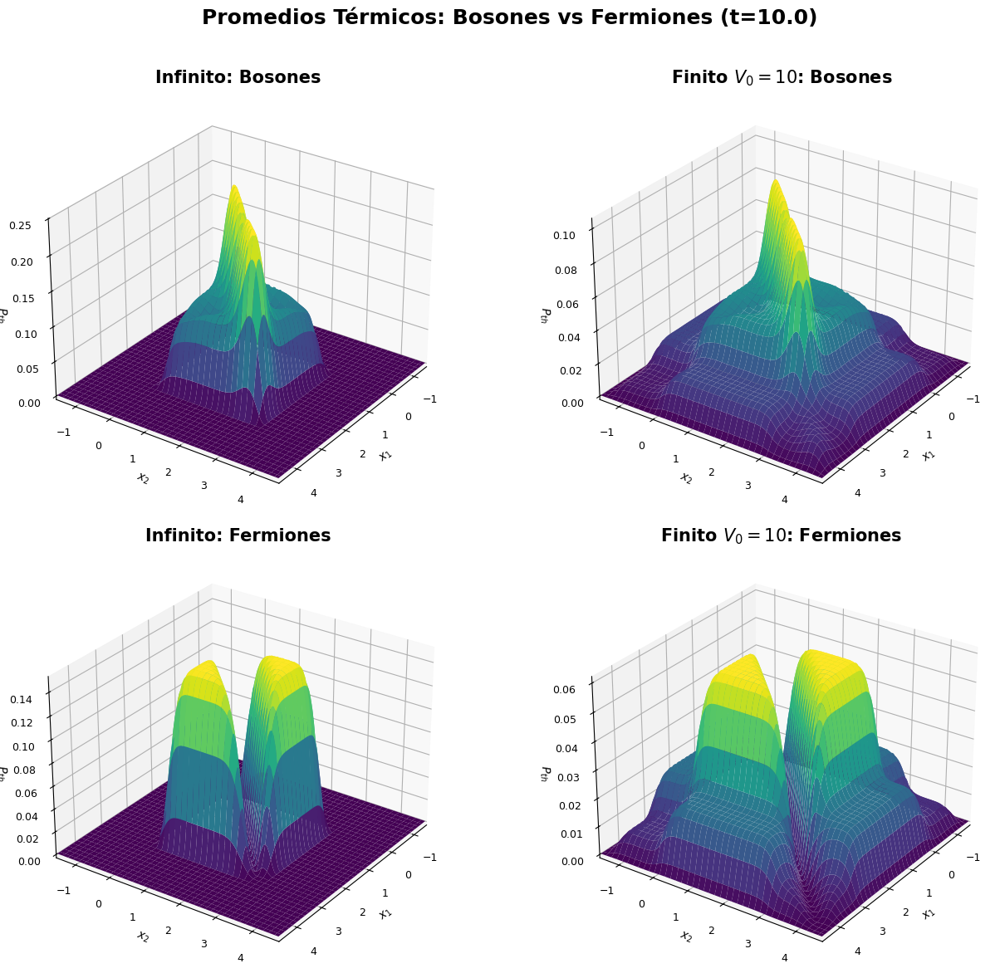


Comparativa 2x2: Spin-1/2 vs Spin-1


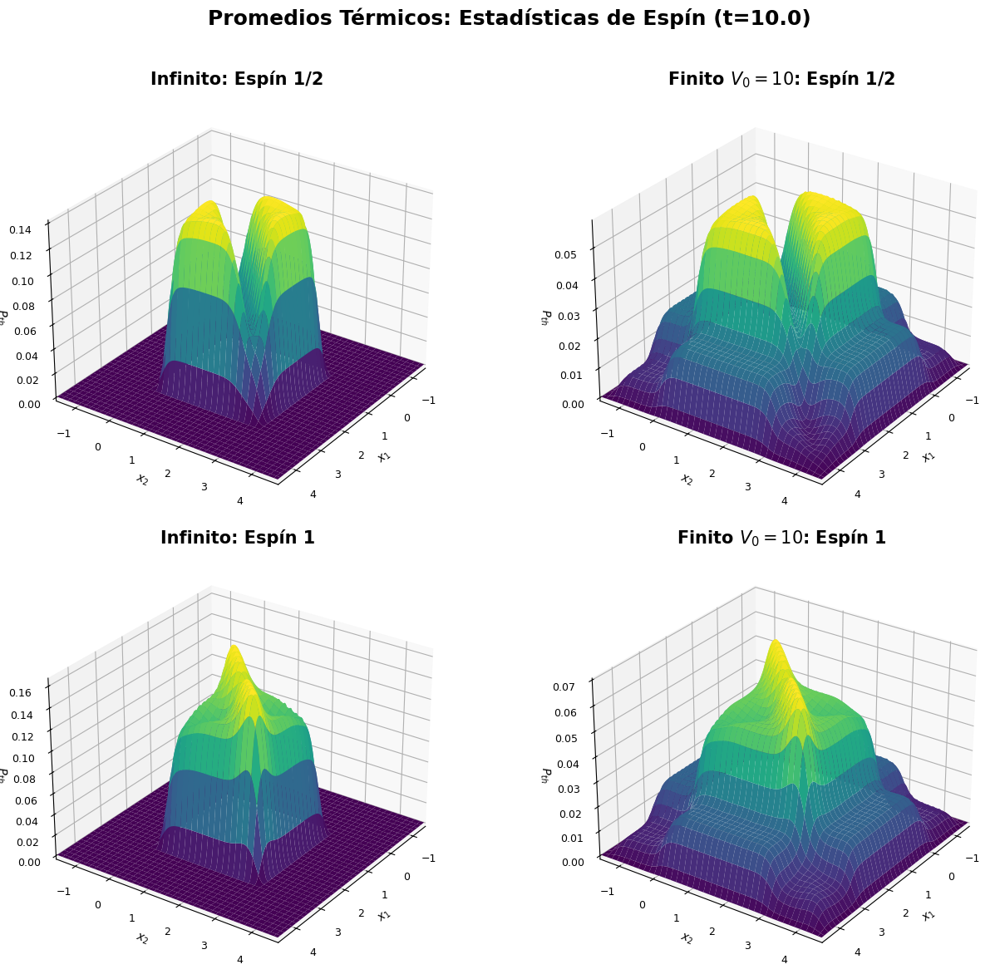

In [ ]:
# Figura 4 (3D): Promedios Térmicos - Comparativa 2x2 para cada estadística

def plot_thermal_3d_grid(type_s, t_val=10.0, ds=5):
    """
    Crea una comparación 2x2 en 3D para promedios térmicos:
    - Fila superior: bosón (izq: infinito, der: finito)
    - Fila inferior: fermión (izq: infinito, der: finito)
    O para spin cases:
    - Fila superior: spin1/2 (izq: infinito, der: finito)
    - Fila inferior: spin1 (izq: infinito, der: finito)
    """
    # Downsample grid
    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)

    # Determinar qué estadísticas mostrar
    if type_s == 'bosonfermion':
        stats = [('boson', 'Bosones'), ('fermion', 'Fermiones')]
        title_main = 'Promedios Térmicos: Bosones vs Fermiones'
    else:  # spin cases
        stats = [('spin1/2', 'Espín 1/2'), ('spin1', 'Espín 1')]
        title_main = 'Promedios Térmicos: Estadísticas de Espín'

    # Crear figura 2x2 con subplots 3D
    fig = plt.figure(figsize=(14, 12))

    for row_idx, (stat_key, stat_label) in enumerate(stats):
        # Calcular probabilidades térmicas
        P_inf_full = calc_thermal_2p(t_val, stat_key, 'Infinite', nmax=18)
        P_inf = P_inf_full[::ds, ::ds]

        P_fin_full = calc_thermal_2p(t_val, stat_key, 'Low', nmax=28)
        P_fin = P_fin_full[::ds, ::ds]

        # Subplot izquierdo (Infinito)
        ax_inf = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_inf.plot_surface(X1, X2, P_inf, cmap='viridis', linewidth=0, antialiased=True)
        ax_inf.set_title(f'Infinito: {stat_label}', fontsize=15, fontweight='bold')
        ax_inf.set_xlabel('$x_1$', fontsize=10)
        ax_inf.set_ylabel('$x_2$', fontsize=10)
        ax_inf.set_zlabel('$P_{{th}}$', fontsize=10)
        ax_inf.tick_params(axis='both', labelsize=9)
        ax_inf.view_init(elev=28, azim=35)
        ax_inf.set_xlim(X_MIN, X_MAX)
        ax_inf.set_ylim(X_MIN, X_MAX)

        # Subplot derecho (Finito)
        ax_fin = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_fin.plot_surface(X1, X2, P_fin, cmap='viridis', linewidth=0, antialiased=True)
        ax_fin.set_title(f'Finito $V_0=10$: {stat_label}', fontsize=15, fontweight='bold')
        ax_fin.set_xlabel('$x_1$', fontsize=10)
        ax_fin.set_ylabel('$x_2$', fontsize=10)
        ax_fin.set_zlabel('$P_{{th}}$', fontsize=10)
        ax_fin.tick_params(axis='both', labelsize=9)
        ax_fin.view_init(elev=28, azim=35)
        ax_fin.set_xlim(X_MIN, X_MAX)
        ax_fin.set_ylim(X_MIN, X_MAX)

    fig.suptitle(f'{title_main} (t={t_val})',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print(f"\nFigura 4 (3D): Promedios Térmicos - T={T_THERMAL}")
print("Comparativa 2x2: Bosones vs Fermiones")
plot_thermal_3d_grid('bosonfermion', t_val=T_THERMAL, ds=5)

print("\nComparativa 2x2: Spin-1/2 vs Spin-1")
plot_thermal_3d_grid('spin', t_val=T_THERMAL, ds=5)

## Pozos Suaves: Armónico Finito vs Pozo en V

Extensión del marco teórico para comparar dos potenciales finitos y suaves usando el mismo dominio que el pozo cuadrado (centro en $x_0 = \pi/2$):

- Armónico truncado: $V_{\rm harm}(x) = \min\!\big(\tfrac12 m \omega^2 (x-x_0)^2,\, V_0\big)$. Espaciado casi uniforme $\Delta E \approx \hbar\omega$ cerca del fondo, con compresión espectral cuando $E_n \to V_0$.
- Pozo en V truncado: $V_{\rm V}(x) = \min\!\big( \alpha |x-x_0|,\, V_0 \big)$. Para $V_0 \to \infty$ el espectro sigue $E_n \propto (n+\tfrac34)^{2/3}$ (raíces de Airy); al truncar, los niveles altos se agrupan y se vuelven cuasi continuos.

Ambos pozos tienen barreras finitas: las autofunciones muestran colas evanescentes y, por encima de $V_0$, un continuo discretizado por el dominio. Numerov maneja el cusp de la cuña evaluando $V(x)$ punto a punto sin derivadas del potencial.


Figura 4bis (Heatmap): Comparativa armónico vs V - T=10.0


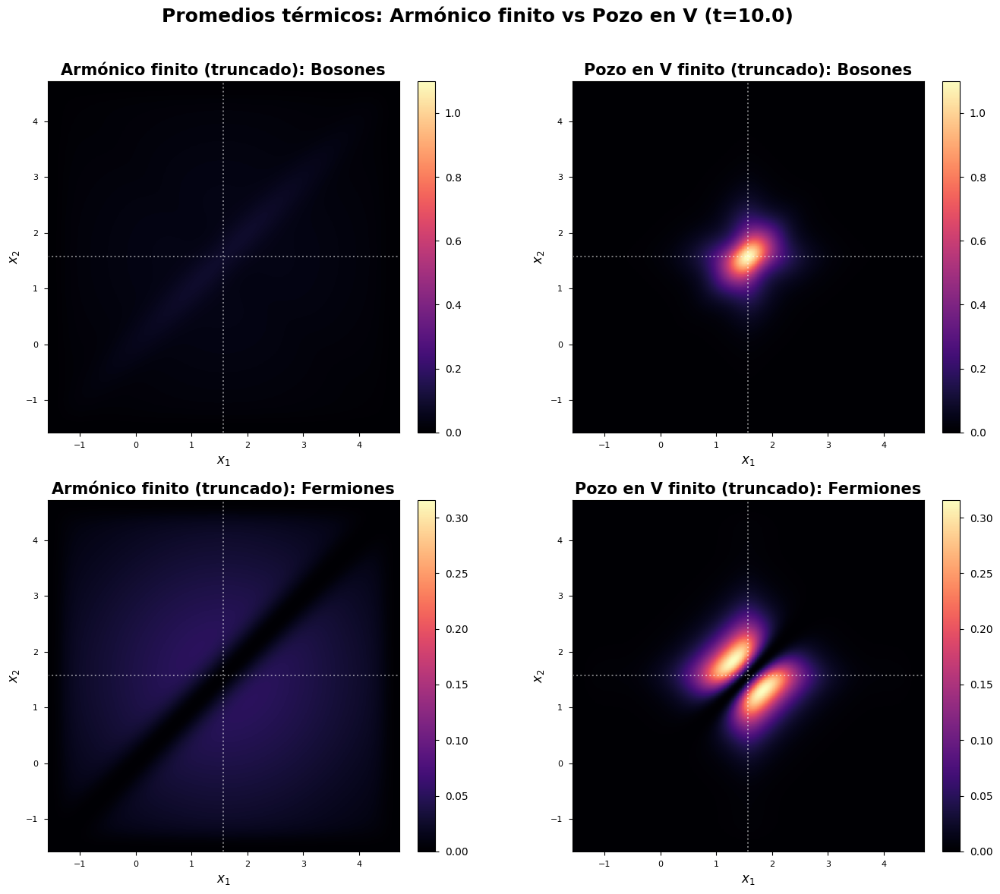

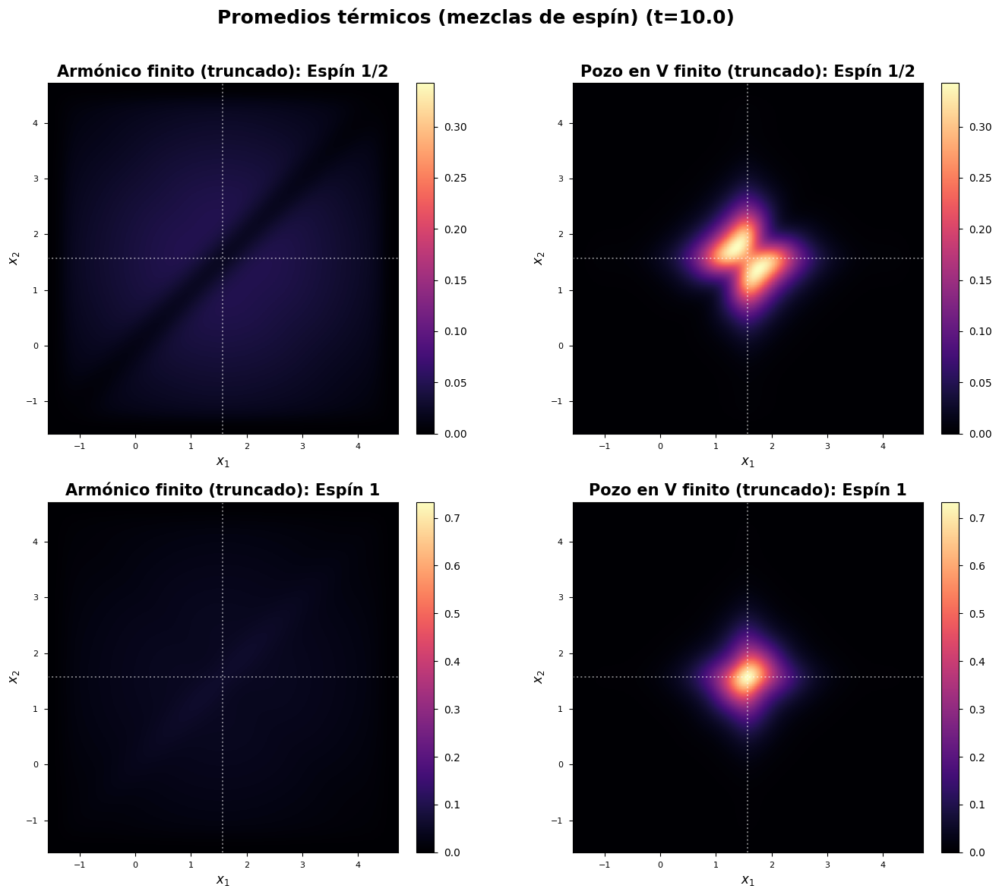

In [ ]:
# Figura 4bis: Comparativa térmica (armónico finito vs pozo en V)

def plot_soft_thermal_heatmap(type_s='bosonfermion', t_val=10.0, nmax=22):
    if type_s == 'bosonfermion':
        stats = [('boson', 'Bosones'), ('fermion', 'Fermiones')]
        title_main = 'Promedios térmicos: Armónico finito vs Pozo en V'
    else:
        stats = [('spin1/2', 'Espín 1/2'), ('spin1', 'Espín 1')]
        title_main = 'Promedios térmicos (mezclas de espín)'

    potentials = [('Harmonic', ALT_POTENTIALS['Harmonic']['label']),
                  ('VShape', ALT_POTENTIALS['VShape']['label'])]

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (stat_key, stat_label) in enumerate(stats):
        P_left = calc_thermal_2p(t_val, stat_key, potentials[0][0], nmax=nmax)
        P_right = calc_thermal_2p(t_val, stat_key, potentials[1][0], nmax=nmax)
        vmax = max(np.max(P_left), np.max(P_right))

        ax_l = axes[row_idx, 0]
        im_l = ax_l.pcolormesh(X_GRID, X_GRID, P_left, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_l.set_title(f"{potentials[0][1]}: {stat_label}", fontsize=15, fontweight='bold')
        ax_l.set_aspect('equal')
        ax_l.set_xlabel('$x_1$')
        ax_l.set_ylabel('$x_2$')
        ax_l.axvline(np.pi/2, color='w', linestyle=':', alpha=0.5)
        ax_l.axhline(np.pi/2, color='w', linestyle=':', alpha=0.5)

        ax_r = axes[row_idx, 1]
        im_r = ax_r.pcolormesh(X_GRID, X_GRID, P_right, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_r.set_title(f"{potentials[1][1]}: {stat_label}", fontsize=15, fontweight='bold')
        ax_r.set_aspect('equal')
        ax_r.set_xlabel('$x_1$')
        ax_r.set_ylabel('$x_2$')
        ax_r.axvline(np.pi/2, color='w', linestyle=':', alpha=0.5)
        ax_r.axhline(np.pi/2, color='w', linestyle=':', alpha=0.5)

        cbar_l = fig.colorbar(im_l, ax=ax_l, fraction=0.046, pad=0.04)
        cbar_l.ax.tick_params(labelsize=10)
        cbar_r = fig.colorbar(im_r, ax=ax_r, fraction=0.046, pad=0.04)
        cbar_r.ax.tick_params(labelsize=10)

    fig.suptitle(f'{title_main} (t={t_val})', fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print(f"Figura 4bis (Heatmap): Comparativa armónico vs V - T={T_THERMAL}")
plot_soft_thermal_heatmap('bosonfermion', t_val=T_THERMAL, nmax=22)
plot_soft_thermal_heatmap('spin', t_val=T_THERMAL, nmax=22)



Figura 4bis (3D): Comparativa armónico vs V - T=10.0


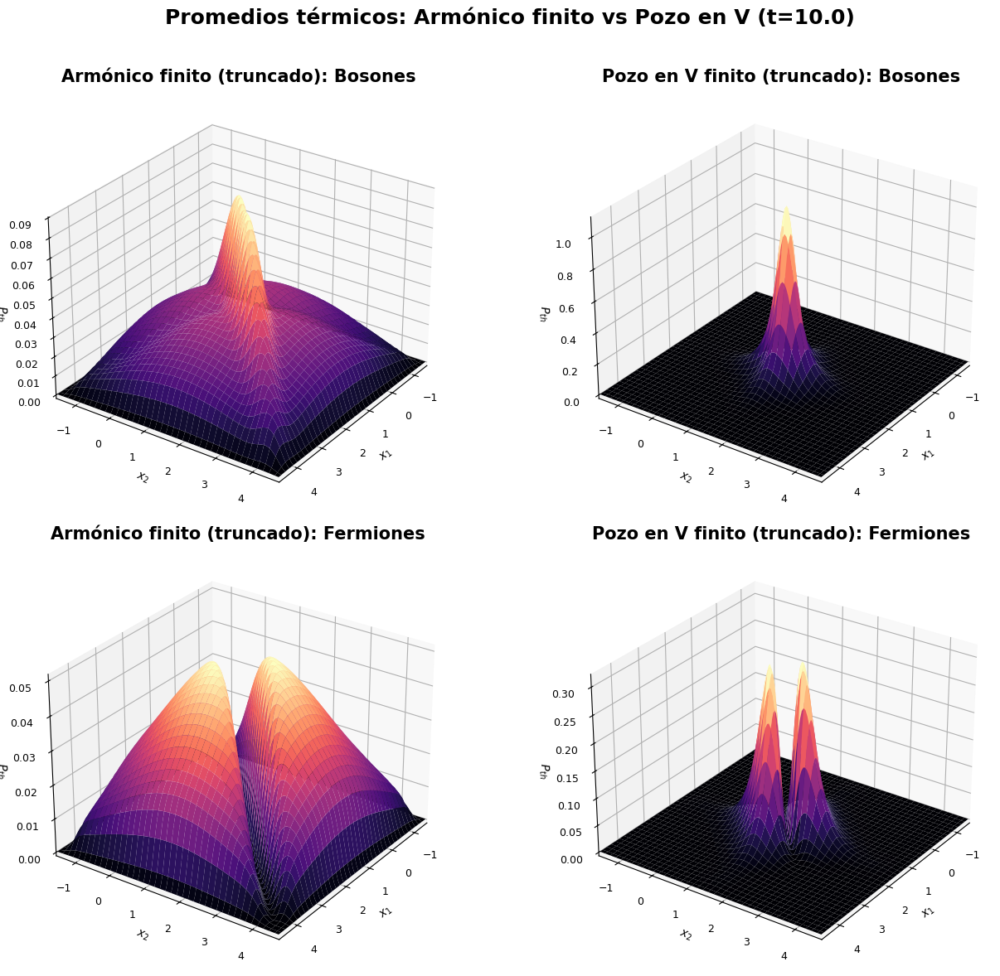

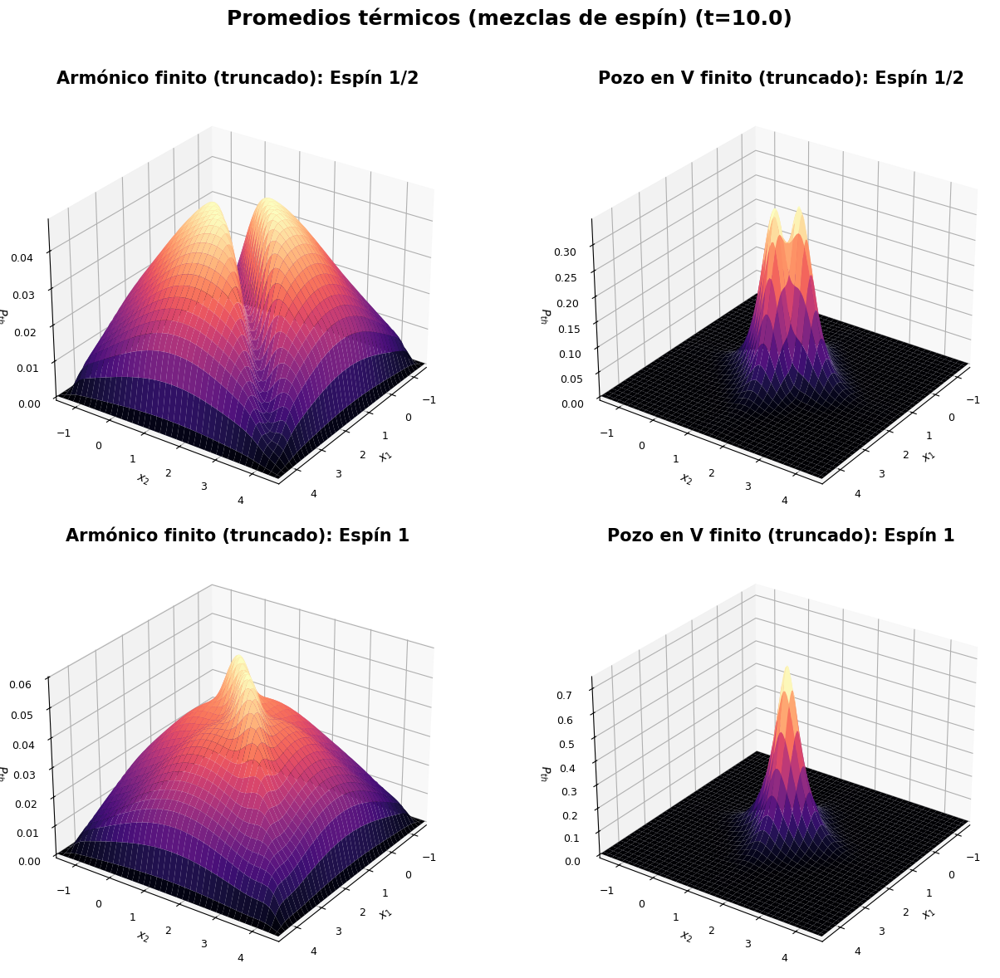

In [ ]:
def plot_soft_thermal_3d(type_s='bosonfermion', t_val=10.0, nmax=22, ds=5):
    if type_s == 'bosonfermion':
        stats = [('boson', 'Bosones'), ('fermion', 'Fermiones')]
        title_main = 'Promedios térmicos: Armónico finito vs Pozo en V'
    else:
        stats = [('spin1/2', 'Espín 1/2'), ('spin1', 'Espín 1')]
        title_main = 'Promedios térmicos (mezclas de espín)'

    potentials = [('Harmonic', ALT_POTENTIALS['Harmonic']['label']),
                  ('VShape', ALT_POTENTIALS['VShape']['label'])]

    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)

    fig = plt.figure(figsize=(14, 12))

    for row_idx, (stat_key, stat_label) in enumerate(stats):
        P_left = calc_thermal_2p(t_val, stat_key, potentials[0][0], nmax=nmax)[::ds, ::ds]
        P_right = calc_thermal_2p(t_val, stat_key, potentials[1][0], nmax=nmax)[::ds, ::ds]

        ax_l = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_l.plot_surface(X1, X2, P_left, cmap='magma', linewidth=0, antialiased=True)
        ax_l.set_title(f"{potentials[0][1]}: {stat_label}", fontsize=15, fontweight='bold')
        ax_l.set_xlabel('$x_1$', fontsize=10)
        ax_l.set_ylabel('$x_2$', fontsize=10)
        ax_l.set_zlabel('$P_{th}$', fontsize=10)
        ax_l.tick_params(axis='both', labelsize=9)
        ax_l.view_init(elev=28, azim=35)
        ax_l.set_xlim(X_MIN, X_MAX)
        ax_l.set_ylim(X_MIN, X_MAX)

        ax_r = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_r.plot_surface(X1, X2, P_right, cmap='magma', linewidth=0, antialiased=True)
        ax_r.set_title(f"{potentials[1][1]}: {stat_label}", fontsize=15, fontweight='bold')
        ax_r.set_xlabel('$x_1$', fontsize=10)
        ax_r.set_ylabel('$x_2$', fontsize=10)
        ax_r.set_zlabel('$P_{th}$', fontsize=10)
        ax_r.tick_params(axis='both', labelsize=9)
        ax_r.view_init(elev=28, azim=35)
        ax_r.set_xlim(X_MIN, X_MAX)
        ax_r.set_ylim(X_MIN, X_MAX)

    fig.suptitle(f'{title_main} (t={t_val})', fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print(f"\nFigura 4bis (3D): Comparativa armónico vs V - T={T_THERMAL}")
plot_soft_thermal_3d('bosonfermion', t_val=T_THERMAL, nmax=22, ds=5)
plot_soft_thermal_3d('spin', t_val=T_THERMAL, nmax=22, ds=5)


## Figura 5: Casos Específicos con Espín 1/2

Detalle de estados individuales mixtos ($n_1, n_2$) para fermiones de espín 1/2.
Mezcla: $0.25 P_S + 0.75 P_A$.
Se observa cómo la simetrización de espín afecta la distribución espacial incluso en el régimen de pozo finito.


Figura 5 (Heatmap): Estados con Espín 1/2 - Comparativa 2x2


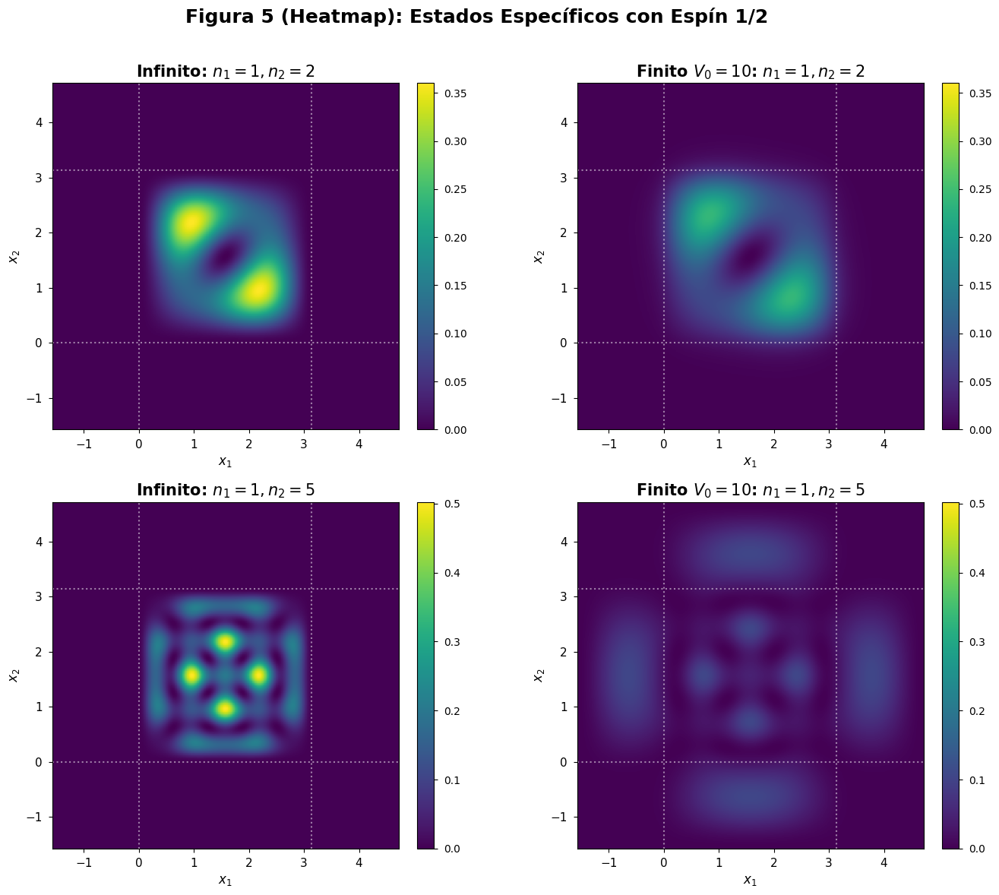

In [ ]:
def plot_spin_heatmap_grid():
    """
    Crea una comparación 2x2 en heatmap para estados con espín 1/2:
    - Fila superior: (n1=1, n2=2) - izq: infinito, der: finito
    - Fila inferior: (n1=1, n2=5) - izq: infinito, der: finito
    """
    states = [(1, 2), (1, 5)]

    # Crear figura 2x2 con subplots de heatmap
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Calcular probabilidades con mezcla de espín 1/2
        # Infinito
        P_S_inf = get_pair_prob(n1, n2, 'boson', 'Infinite')
        P_A_inf = get_pair_prob(n1, n2, 'fermion', 'Infinite')
        P_inf = 0.25 * P_S_inf + 0.75 * P_A_inf

        # Finito
        P_S_fin = get_pair_prob(n1, n2, 'boson', 'Low')
        P_A_fin = get_pair_prob(n1, n2, 'fermion', 'Low')
        P_fin = 0.25 * P_S_fin + 0.75 * P_A_fin

        # Encontrar vmax común para la fila
        vmax = max(np.max(P_inf), np.max(P_fin))

        # Subplot izquierdo (Infinito)
        ax_inf = axes[row_idx, 0]
        im_inf = ax_inf.pcolormesh(X_GRID, X_GRID, P_inf, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_inf.set_title(f'Infinito: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_inf.set_aspect('equal')
        ax_inf.set_xlabel('$x_1$', fontsize=12)
        ax_inf.set_ylabel('$x_2$', fontsize=12)
        ax_inf.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_inf.axvline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
            ax_inf.axhline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)

        # Subplot derecho (Finito)
        ax_fin = axes[row_idx, 1]
        im_fin = ax_fin.pcolormesh(X_GRID, X_GRID, P_fin, cmap='viridis',
                                    shading='auto', vmin=0, vmax=vmax)
        ax_fin.set_title(f'Finito $V_0=10$: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_fin.set_aspect('equal')
        ax_fin.set_xlabel('$x_1$', fontsize=12)
        ax_fin.set_ylabel('$x_2$', fontsize=12)
        ax_fin.tick_params(labelsize=11)

        # Dibujar líneas de referencia del pozo
        for l in [0, np.pi]:
            ax_fin.axvline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)
            ax_fin.axhline(l, color='w', linestyle=':', alpha=0.5, linewidth=1.5)

        # Añadir colorbars individuales
        cbar_inf = fig.colorbar(im_inf, ax=ax_inf, fraction=0.046, pad=0.04)
        cbar_inf.ax.tick_params(labelsize=10)
        cbar_fin = fig.colorbar(im_fin, ax=ax_fin, fraction=0.046, pad=0.04)
        cbar_fin.ax.tick_params(labelsize=10)

    fig.suptitle('Figura 5 (Heatmap): Estados Específicos con Espín 1/2',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("Figura 5 (Heatmap): Estados con Espín 1/2 - Comparativa 2x2")
plot_spin_heatmap_grid()


Figura 5 (3D): Estados con Espín 1/2 - Comparativa 2x2


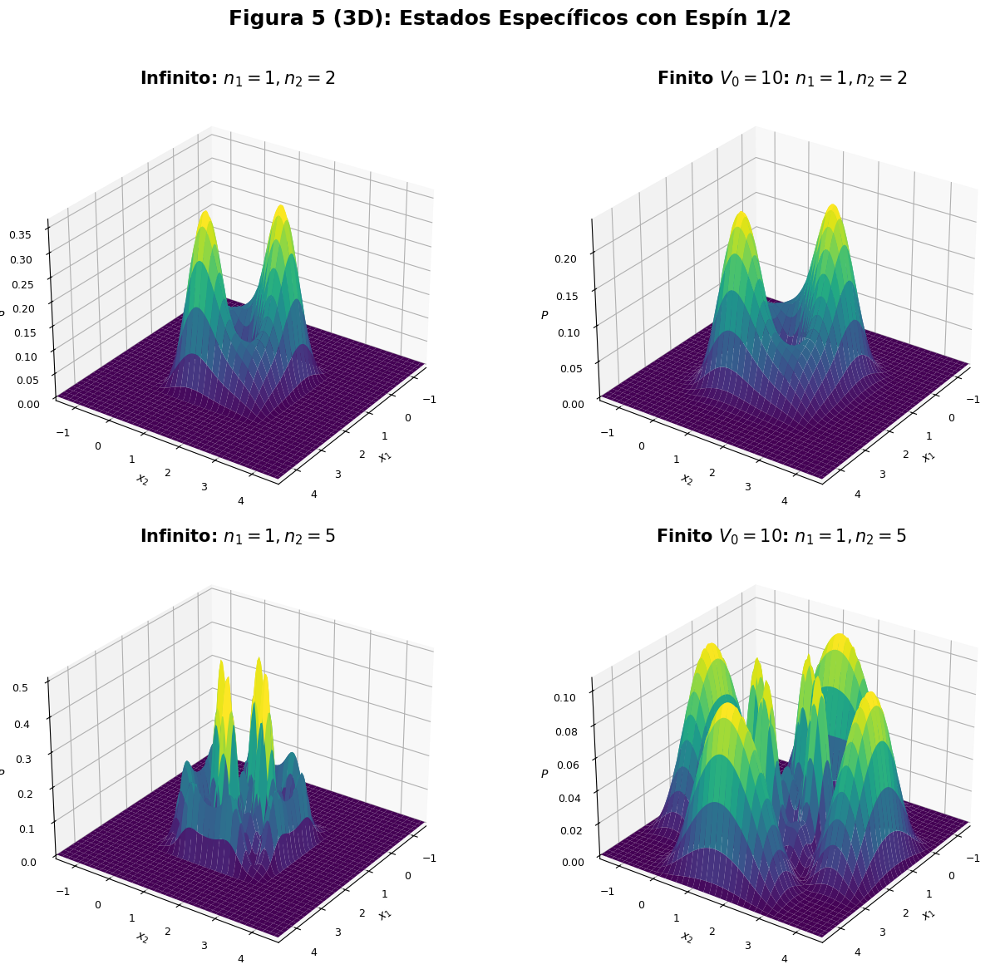

In [ ]:
# Figura 5 (3D): Estados Específicos con Espín 1/2 - Comparativa 2x2

def plot_spin_3d_grid(ds=5):
    """
    Crea una comparación 2x2 en 3D para estados con espín 1/2:
    - Fila superior: (n1=1, n2=2) - izq: infinito, der: finito
    - Fila inferior: (n1=1, n2=5) - izq: infinito, der: finito
    """
    # Downsample grid
    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)

    states = [(1, 2), (1, 5)]

    # Crear figura 2x2 con subplots 3D
    fig = plt.figure(figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Calcular probabilidades con mezcla de espín 1/2
        # Infinito
        P_S_inf = get_pair_prob(n1, n2, 'boson', 'Infinite')
        P_A_inf = get_pair_prob(n1, n2, 'fermion', 'Infinite')
        P_inf_full = 0.25 * P_S_inf + 0.75 * P_A_inf
        P_inf = P_inf_full[::ds, ::ds]

        # Finito
        P_S_fin = get_pair_prob(n1, n2, 'boson', 'Low')
        P_A_fin = get_pair_prob(n1, n2, 'fermion', 'Low')
        P_fin_full = 0.25 * P_S_fin + 0.75 * P_A_fin
        P_fin = P_fin_full[::ds, ::ds]

        # Subplot izquierdo (Infinito)
        ax_inf = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_inf.plot_surface(X1, X2, P_inf, cmap='viridis', linewidth=0, antialiased=True)
        ax_inf.set_title(f'Infinito: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_inf.set_xlabel('$x_1$', fontsize=10)
        ax_inf.set_ylabel('$x_2$', fontsize=10)
        ax_inf.set_zlabel('$P$', fontsize=10)
        ax_inf.tick_params(axis='both', labelsize=9)
        ax_inf.view_init(elev=28, azim=35)
        ax_inf.set_xlim(X_MIN, X_MAX)
        ax_inf.set_ylim(X_MIN, X_MAX)

        # Subplot derecho (Finito)
        ax_fin = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_fin.plot_surface(X1, X2, P_fin, cmap='viridis', linewidth=0, antialiased=True)
        ax_fin.set_title(f'Finito $V_0=10$: $n_1={n1}, n_2={n2}$', fontsize=15, fontweight='bold')
        ax_fin.set_xlabel('$x_1$', fontsize=10)
        ax_fin.set_ylabel('$x_2$', fontsize=10)
        ax_fin.set_zlabel('$P$', fontsize=10)
        ax_fin.tick_params(axis='both', labelsize=9)
        ax_fin.view_init(elev=28, azim=35)
        ax_fin.set_xlim(X_MIN, X_MAX)
        ax_fin.set_ylim(X_MIN, X_MAX)

    fig.suptitle('Figura 5 (3D): Estados Específicos con Espín 1/2',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("\nFigura 5 (3D): Estados con Espín 1/2 - Comparativa 2x2")
plot_spin_3d_grid(ds=5)

## Figura 5bis: Casos Específicos con Espín 1/2 en Pozos Suaves

Análogo a Figura 5, aquí mostramos estados específicos ($n_1, n_2$) con mezcla de espín 1/2 fermiónica: $0.25 P_S + 0.75 P_A$. Se comparan armónico finito vs pozo en V finito.

Observamos cómo la simetrización de espín y la forma del potencial actúan conjuntamente: el armónico suaviza la densidad mientras que el V-shaped introduce concentración en regiones lineales.


Figura 5bis (Heatmap): Estados con Espín 1/2 - Armónico vs Pozo en V


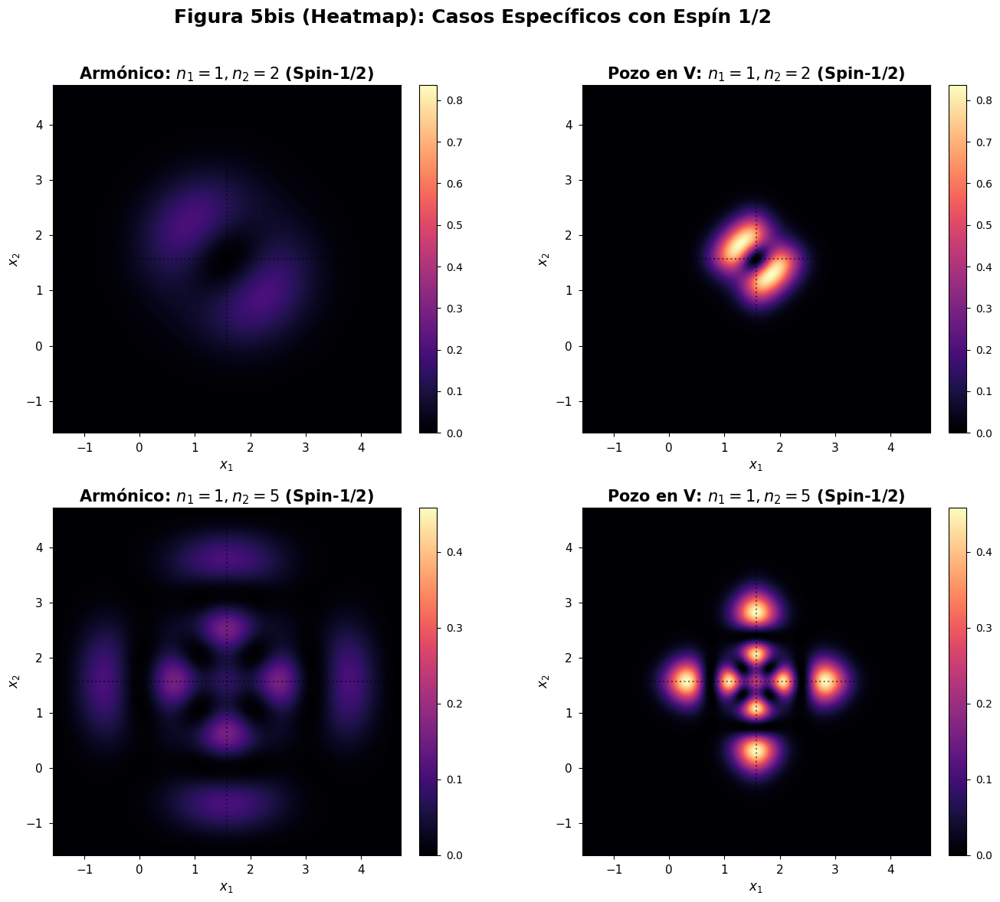

In [ ]:
def plot_soft_spin_heatmap():
    """Heatmap de pares (n1,n2) con mezcla spin-1/2 para armónico vs V-shaped."""
    states = [(1, 2), (1, 5)]

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Mezcla spin-1/2: 0.25 bosón + 0.75 fermión
        P_S_harm = get_pair_prob(n1, n2, 'boson', 'Harmonic')
        P_A_harm = get_pair_prob(n1, n2, 'fermion', 'Harmonic')
        P_harm = 0.25 * P_S_harm + 0.75 * P_A_harm

        P_S_vsh = get_pair_prob(n1, n2, 'boson', 'VShape')
        P_A_vsh = get_pair_prob(n1, n2, 'fermion', 'VShape')
        P_vsh = 0.25 * P_S_vsh + 0.75 * P_A_vsh

        vmax = max(np.max(P_harm), np.max(P_vsh))

        # Armónico
        ax_h = axes[row_idx, 0]
        im_h = ax_h.pcolormesh(X_GRID, X_GRID, P_harm, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_h.set_title(f'Armónico: $n_1={n1}, n_2={n2}$ (Spin-1/2)', fontsize=15, fontweight='bold')
        ax_h.set_aspect('equal')
        ax_h.set_xlabel('$x_1$', fontsize=12)
        ax_h.set_ylabel('$x_2$', fontsize=12)
        ax_h.axvline(np.pi/2, color='k', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_h.axhline(np.pi/2, color='k', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_h.tick_params(labelsize=11)

        # Pozo en V
        ax_v = axes[row_idx, 1]
        im_v = ax_v.pcolormesh(X_GRID, X_GRID, P_vsh, cmap='magma', shading='auto', vmin=0, vmax=vmax)
        ax_v.set_title(f'Pozo en V: $n_1={n1}, n_2={n2}$ (Spin-1/2)', fontsize=15, fontweight='bold')
        ax_v.set_aspect('equal')
        ax_v.set_xlabel('$x_1$', fontsize=12)
        ax_v.set_ylabel('$x_2$', fontsize=12)
        ax_v.axvline(np.pi/2, color='k', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_v.axhline(np.pi/2, color='k', linestyle=':', alpha=0.5, linewidth=1.5)
        ax_v.tick_params(labelsize=11)

        cbar_h = fig.colorbar(im_h, ax=ax_h, fraction=0.046, pad=0.04)
        cbar_h.ax.tick_params(labelsize=10)
        cbar_v = fig.colorbar(im_v, ax=ax_v, fraction=0.046, pad=0.04)
        cbar_v.ax.tick_params(labelsize=10)

    fig.suptitle('Figura 5bis (Heatmap): Casos Específicos con Espín 1/2',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("Figura 5bis (Heatmap): Estados con Espín 1/2 - Armónico vs Pozo en V")
plot_soft_spin_heatmap()


Figura 5bis (3D): Estados con Espín 1/2 - Armónico vs Pozo en V


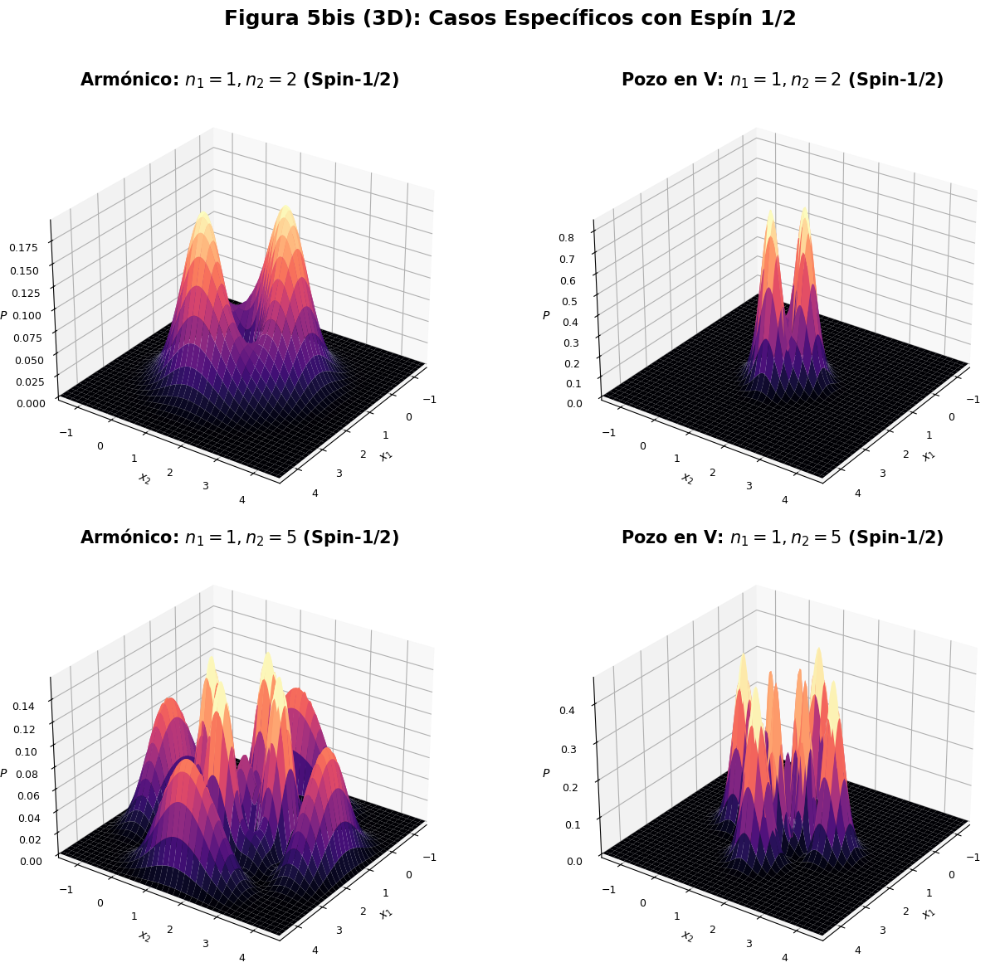

In [ ]:
def plot_soft_spin_3d(ds=5):
    """3D de pares (n1,n2) con mezcla spin-1/2 para armónico vs V-shaped."""
    x_s = X_GRID[::ds]
    X1, X2 = np.meshgrid(x_s, x_s)

    states = [(1, 2), (1, 5)]
    fig = plt.figure(figsize=(14, 12))

    for row_idx, (n1, n2) in enumerate(states):
        # Mezcla spin-1/2: 0.25 bosón + 0.75 fermión
        P_S_harm = get_pair_prob(n1, n2, 'boson', 'Harmonic')
        P_A_harm = get_pair_prob(n1, n2, 'fermion', 'Harmonic')
        P_harm_full = 0.25 * P_S_harm + 0.75 * P_A_harm
        P_harm = P_harm_full[::ds, ::ds]

        P_S_vsh = get_pair_prob(n1, n2, 'boson', 'VShape')
        P_A_vsh = get_pair_prob(n1, n2, 'fermion', 'VShape')
        P_vsh_full = 0.25 * P_S_vsh + 0.75 * P_A_vsh
        P_vsh = P_vsh_full[::ds, ::ds]

        # Armónico
        ax_h = fig.add_subplot(2, 2, row_idx*2 + 1, projection='3d')
        ax_h.plot_surface(X1, X2, P_harm, cmap='magma', linewidth=0, antialiased=True)
        ax_h.set_title(f'Armónico: $n_1={n1}, n_2={n2}$ (Spin-1/2)', fontsize=15, fontweight='bold')
        ax_h.set_xlabel('$x_1$', fontsize=10)
        ax_h.set_ylabel('$x_2$', fontsize=10)
        ax_h.set_zlabel('$P$', fontsize=10)
        ax_h.tick_params(axis='both', labelsize=9)
        ax_h.view_init(elev=28, azim=35)
        ax_h.set_xlim(X_MIN, X_MAX)
        ax_h.set_ylim(X_MIN, X_MAX)

        # Pozo en V
        ax_v = fig.add_subplot(2, 2, row_idx*2 + 2, projection='3d')
        ax_v.plot_surface(X1, X2, P_vsh, cmap='magma', linewidth=0, antialiased=True)
        ax_v.set_title(f'Pozo en V: $n_1={n1}, n_2={n2}$ (Spin-1/2)', fontsize=15, fontweight='bold')
        ax_v.set_xlabel('$x_1$', fontsize=10)
        ax_v.set_ylabel('$x_2$', fontsize=10)
        ax_v.set_zlabel('$P$', fontsize=10)
        ax_v.tick_params(axis='both', labelsize=9)
        ax_v.view_init(elev=28, azim=35)
        ax_v.set_xlim(X_MIN, X_MAX)
        ax_v.set_ylim(X_MIN, X_MAX)

    fig.suptitle('Figura 5bis (3D): Casos Específicos con Espín 1/2',
                 fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

print("\nFigura 5bis (3D): Estados con Espín 1/2 - Armónico vs Pozo en V")
plot_soft_spin_3d(ds=5)
